<div style="width: 100%; clear: both;">
<div style="float: left; width: 50%;">
<img src="http://www.uoc.edu/portal/_resources/common/imatges/marca_UOC/UOC_Masterbrand.jpg", align="left">
</div>
<div style="float: right; width: 50%;">
<p style="margin: 0; padding-top: 22px; text-align:right;">M2.855 · Modelos avanzados de minería de datos · PEC2</p>
<p style="margin: 0; text-align:right;">2021-2 · Máster universitario en Ciencia de datos (Data science)</p>
<p style="margin: 0; text-align:right; padding-button: 100px;">Estudios de Informática, Multimedia y Telecomunicación</p>
</div>
</div>
<div style="width:100%;">&nbsp;</div>


# PEC 2: Métodos no supervisados

**Importante: la entrega debe contener el notebook (.ipynb) y su HTML tras la completa ejecución secuencial (.html) donde se pueda ver el código y los resultados. Para exportar el notebook a HTML puedes hacerlo desde el menú File → Download as → HTML.**

A lo largo de esta práctica veremos como aplicar distintas técnicas no supervisadas
así como algunas de sus aplicaciones reales:

 - **[Clustering con distintas estrategias](#ej1)**: k-means y regla del codo, basadas en densidad y jerárquicas.
 - **[Ejemplo práctico con aperturas de ajedrez](#ej2)**: reducción de dimensionalidad, clustering y análisis.

<div class="alert alert-block alert-info">
<strong>Nombre y apellidos:</strong> Victor H. Ayala Sánchez
</div>

---

Para ello vamos a necesitar las siguientes librerías:

In [212]:
import random

import tqdm
import umap
import numpy as np
import pandas as pd
import sklearn
from sklearn import cluster        # Algoritmos de clustering.
from sklearn import datasets       # Crear datasets.
from sklearn import decomposition  # Algoritmos de reduccion de dimensionalidad.

# Visualizacion.
import matplotlib
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px

%matplotlib inline

<a id="ej1"></a>

## 1. Métodos de *clustering* (4 puntos)

Este ejercicio trata de explorar distintas técnicas de agrupamiento ajustándolas a distintos conjuntos de datos.

El objetivo es doble: entender la influencia de los parámetros en su comportamiento, y conocer sus limitaciones en la búsqueda de estructuras de datos.

### Generación de los conjuntos de datos

In [213]:
X_blobs, y_blobs = datasets.make_blobs(n_samples=1000, n_features=2, centers=4, cluster_std=1.6, random_state=42)
X_moons, y_moons = datasets.make_moons(n_samples=1000, noise=.07, random_state=42)
X_circles, y_circles = datasets.make_circles(n_samples=1000, factor=.5, noise=.05, random_state=42)

Cada dataset tiene 2 variables: una variable *X* que contiene 2 features (columnas) y tantas filas como muestras. Y una variable *y* que alberga las etiquetas que identifican cada cluster.

A lo largo del ejercicio no se usará la variable *y* (sólo con el objetivo de visualizar). El objetivo es a través de los distintos modelos de *clustering* conseguir encontrar las estructuras descritas por las variables *y*.

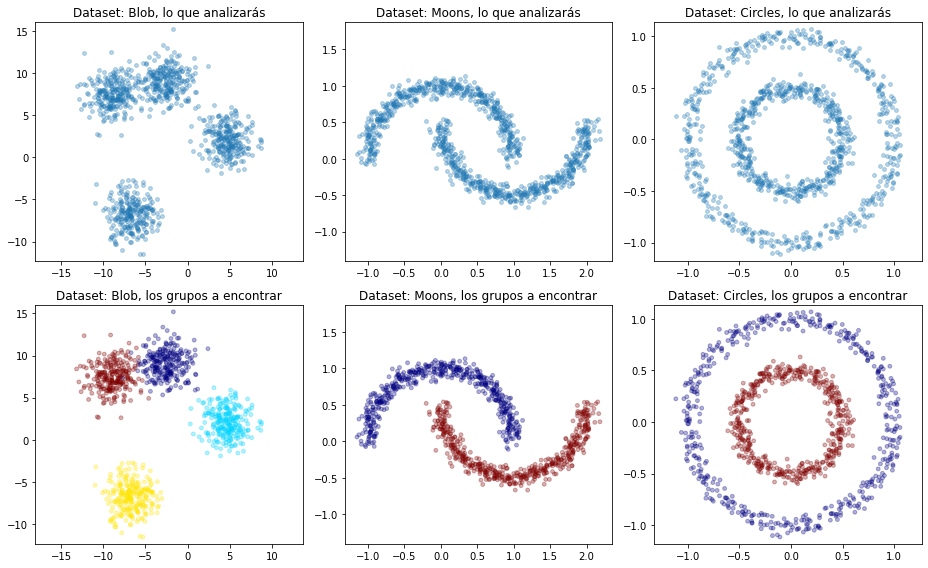

In [214]:
fig, axis = plt.subplots(2, 3, figsize=(13, 8))
for i, (X, y, ax, name) in enumerate(zip([X_blobs, X_moons, X_circles] * 2,
                                         [None] * 3 + [y_blobs, y_moons, y_circles],
                                         axis.reshape(-1),
                                         ['Blob', 'Moons', 'Circles'] * 2)):
    ax.set_title('Dataset: {}, '.format(name) + ('lo que analizarás' if i < 3 else 'los grupos a encontrar'))
    ax.scatter(X[:,0], X[:,1], s=15, c=y, alpha=.3, cmap='jet')
    ax.axis('equal')
plt.tight_layout()

### 1 a. K-means

En este apartado se pide probar el algoritmo *k-means* sobre los tres datasets presentados anteriormente ajustando con los parámetros adecuados y analizar sus resultados.

In [215]:
X, y = X_blobs, y_blobs

Para estimar el número de clusters a detectar por *k-means*. Una técnica para estimar $k$ es, como se explica en la teoría:
> Los criterios anteriores (minimización de distancias intra grupo o maximización de distancias inter grupo) pueden usarse para establecer un valor adecuado para el parámetro k. Valores k para los que ya no se consiguen mejoras significativas en la homogeneidad interna de los segmentos o la heterogeneidad entre segmentos distintos, deberían descartarse.

Lo que popularmente se conocer como *regla del codo*.

Primero es necesario calcular la suma de los errores cuadráticos ([*SSE*](https://bl.ocks.org/rpgove/0060ff3b656618e9136b)) que consiste en la suma de todos los errores (distancia de cada punto a su centroide asignado) al cuadrado.

$$SSE = \sum_{i=1}^{K} \sum_{x \in C_i} euclidean(x, c_i)^2$$

Donde $K$ es el número de clusters a buscar por *k-means*, $x \in C_i$ son los puntos que pertenecen a i-ésimo cluster, $c_i$ es el centroide del cluster $C_i$ (al que pertenece el punto $x$), y $euclidean$ es la [distancia euclídea](https://en.wikipedia.org/wiki/Euclidean_distance).

Este procedimiento realizado para cada posible valor $k$, resulta en una función monótona decreciente, donde el eje $x$ representa los distintos valores de $k$, y el eje $y$ el $SSE$. Intuitivamente se podrá observar un significativo descenso del error, que indicará el valor idóneo de $k$.

**Se pide realizar la representación gráfica de la regla del codo junto a su interpretación, utilizando la librería ```matplotlib``` y la implementación en scikit-learn de [*k-means*](http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html).**

<div class="alert alert-block alert-info">
    <strong>Implementación:</strong> cálculo y visualización de la regla del codo en el dataset Blobs.
</div>

In [216]:
from sklearn.cluster import KMeans

In [217]:
# Definimos una función para graficar y reutilizar en cada dataset

def plot_Elbow_SSE(X, numberOfClusters, dataSetName):
    """
    Retur None, Elbow method with SSE by number of clusters

    X: Numpy Array object or Pandas DataFrame Object. 
    numberOfClusters: The Max number of clusters. Integer
    dataSetName: Str type, name of the dataset.
    """
    
    sse = []
    for i in range(1,numberOfClusters):
        kmeans = KMeans(n_clusters=i).fit(X)
        cluster_centers = [X[kmeans.labels_ == o].mean(axis=0) for o in range(i)]
        clusterwise_sse = [0] * i
        for point, label in zip(X, kmeans.labels_):
            clusterwise_sse[label] += np.square(point - cluster_centers[label]).sum()
        sse.append(sum(clusterwise_sse))

    df_SSEs = pd.DataFrame(zip(list(range(1,numberOfClusters)),sse), columns=["Number of K", "SSE"])
        
    plt.plot(df_SSEs["Number of K"], df_SSEs["SSE"])
    plt.xlabel('k (# de clusters)')
    plt.ylabel('SSE')
    plt.xticks(range(1, numberOfClusters))
    plt.title('Dataset {}'.format(dataSetName))
    plt.grid()
    plt.show()

C:\Users\vicju\anaconda3\envs\uoc20212pec2\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.



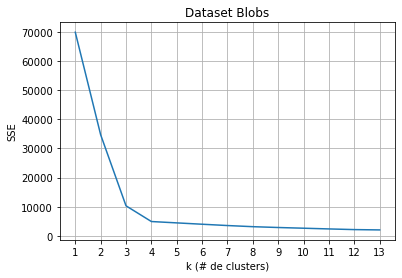

In [218]:
plot_Elbow_SSE(X, 14, "Blobs")

### Referencia
- Rezso, 2021. How to get SSE for each cluster in k means?. Respuesta en StackOverflow.

https://stackoverflow.com/questions/66555997/how-to-get-sse-for-each-cluster-in-k-means

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué se interpreta en la gráfica? ¿Cómo podría mejorarse la elección de $k$?.  
</div>

Tomando como marco de referencia el método del codo, el número óptimo de clusters estaría entre 3 y 4. 
Para mejorar la selección podemos graficar el score Silhouette. Esta métrica nos puede ayudar a analizar que tan cercanas se encuentran las observaciones dentro de los clusters. La métrica debe ser cercana a 1 para entender el número óptimo de clusters

### Referencia
- Raschka S., (2015).Python Machine Learning: Chapter 11: Working with Unlabeled Data – Clustering Analysis. PACKT Lib.

Definimos una función para reutilizar que nos ayude a graficar el score para los distintos datasets

In [219]:
from sklearn.metrics import silhouette_score

def silhouetteGraph(numberCluster, X):
    scores = []
    for i in range(2, numberCluster):
        kmeans = KMeans(n_clusters=i, random_state=10)
        preds = kmeans.fit_predict(X)
        #centers = clusterer.cluster_centers_
        score = silhouette_score(X, preds)
        scores.append(score)
        
    plt.plot( list(range(2, numberCluster)),scores)
    plt.xlabel('k (# Of clusters)')
    plt.ylabel('Silhouette Score')
    plt.xticks(range(1, numberCluster))
    plt.grid()
    plt.show()

Observamos que el número óptimo de Clusters sería 3 o 4 clusters:

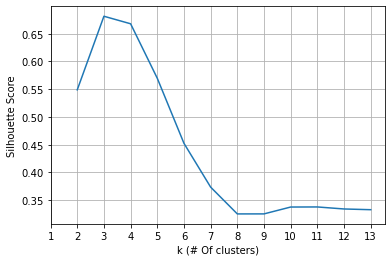

In [220]:
silhouetteGraph(14,X)

Esto debido a que en esos parámetros los modelos tienen un score más cercano a 1

otra manera de analizar la métrica:

In [221]:
import matplotlib.cm as cm
from sklearn.metrics import silhouette_samples

def silhouetteGraph_secondVersion(numberCluster, X):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(12, 5)

    ax1.set_xlim([-1, 1])
    ax1.set_ylim([0, len(X) + (numberCluster + 1) * 10])

    clusterer = KMeans(n_clusters=numberCluster, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
            "For n_clusters =",
            numberCluster,
            "The average silhouette_score is :",
            silhouette_avg,
        )
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(numberCluster):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        color = cm.nipy_spectral(float(i) / numberCluster)
        ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / numberCluster)
        ax2.scatter(
            X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        )

        # Labeling the clusters
        centers = clusterer.cluster_centers_
        # Draw white circles at cluster centers
        ax2.scatter(
            centers[:, 0],
            centers[:, 1],
            marker="o",
            c="white",
            alpha=1,
            s=200,
            edgecolor="k",
        )

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(
            "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
            % numberCluster,
            fontsize=14,
            fontweight="bold",
        )

    plt.show()

---------------
For n_clusters = 2 The average silhouette_score is : 0.5488674911415737


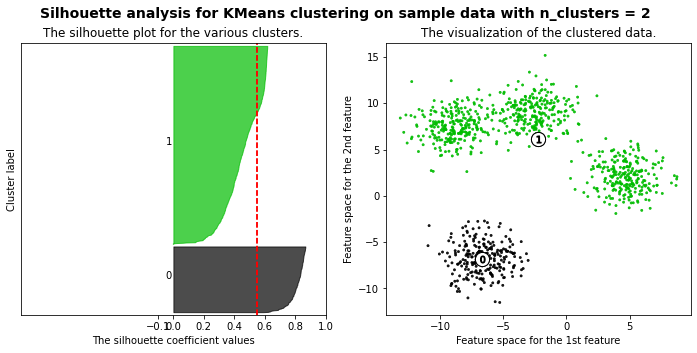

---------------
For n_clusters = 3 The average silhouette_score is : 0.6814833917748337


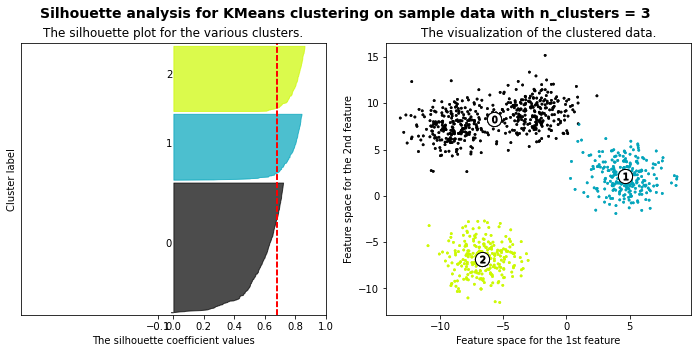

---------------
For n_clusters = 4 The average silhouette_score is : 0.6678992533189723


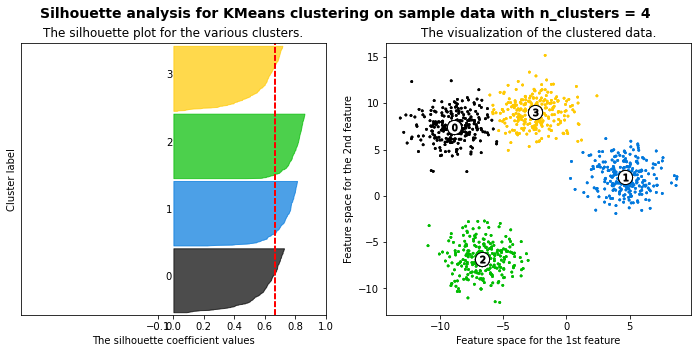

---------------
For n_clusters = 5 The average silhouette_score is : 0.5696667841902672


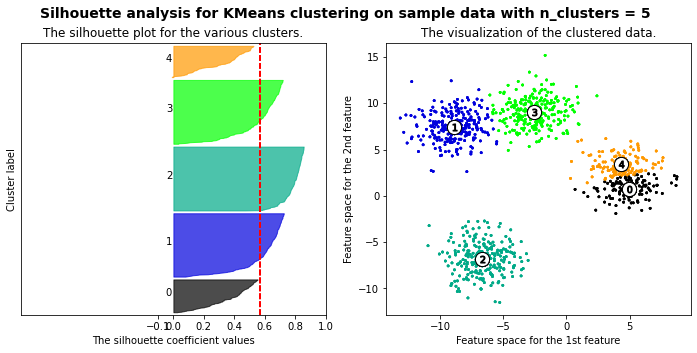

---------------
For n_clusters = 6 The average silhouette_score is : 0.45244435771077285


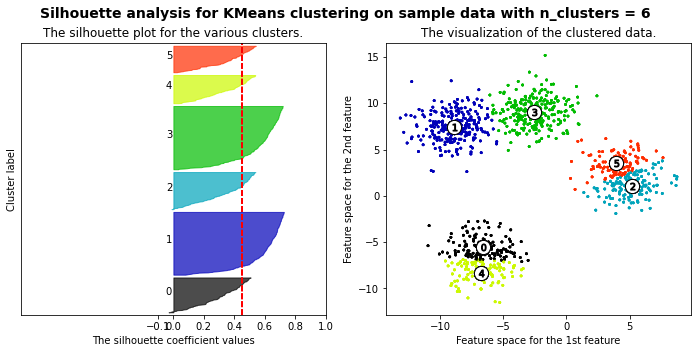

---------------
For n_clusters = 7 The average silhouette_score is : 0.3734766807837641


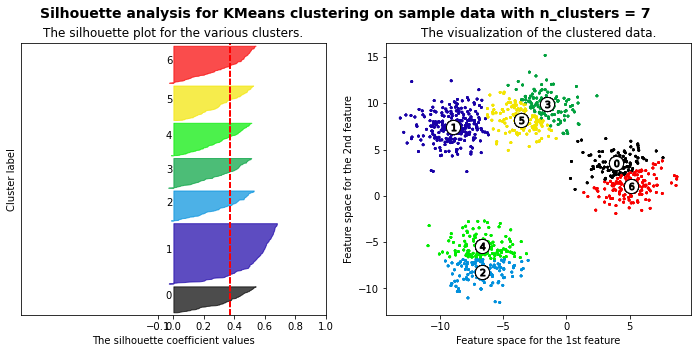

---------------
For n_clusters = 8 The average silhouette_score is : 0.32517922080370393


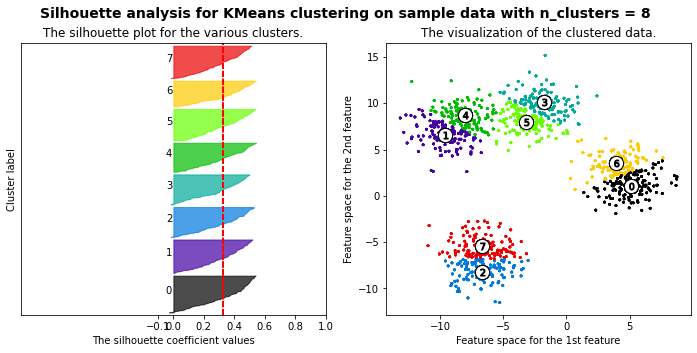

---------------
For n_clusters = 9 The average silhouette_score is : 0.3252289145122296


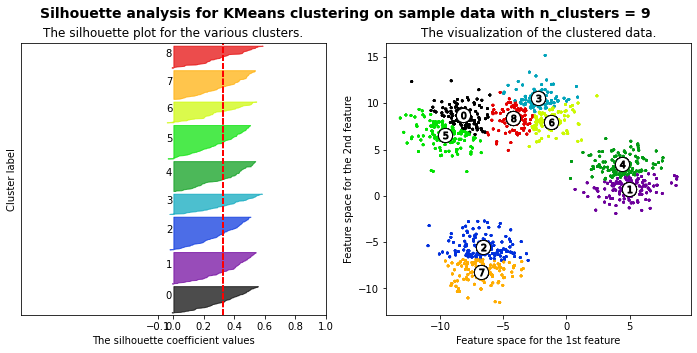

---------------
For n_clusters = 10 The average silhouette_score is : 0.3375800149749205


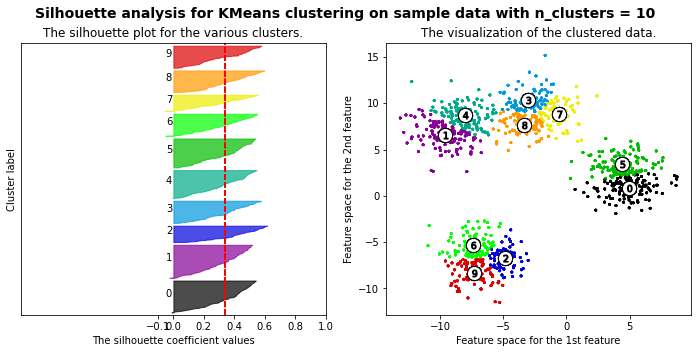

---------------
For n_clusters = 11 The average silhouette_score is : 0.33773595759628083


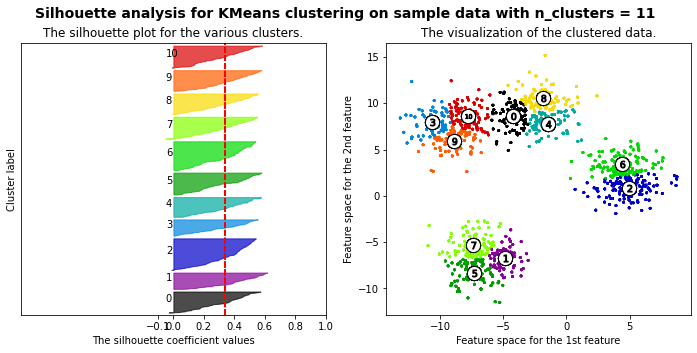

---------------
For n_clusters = 12 The average silhouette_score is : 0.33409200497549596


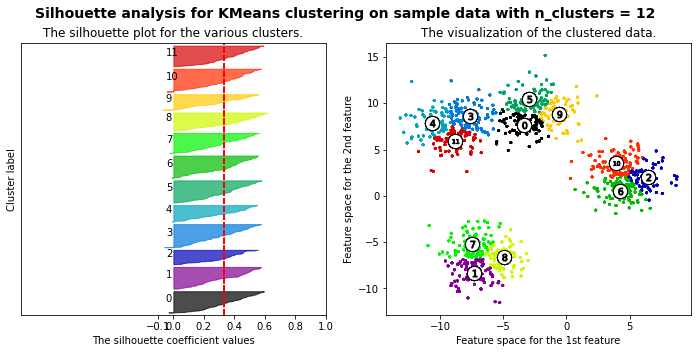

---------------
For n_clusters = 13 The average silhouette_score is : 0.33277686201376117


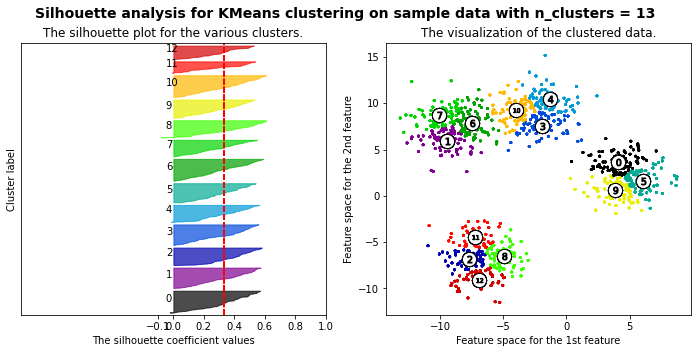

In [222]:
for i in list(range(2,14)):
    print("---------------")
    silhouetteGraph_secondVersion(i, X)

Adaptación propia del ejemplo presentado en la documentación de SciKit Learn:
    
https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> cálculo y visualización de los grupos en el dataset Blobs.
</div>

Tomando los 3 análisis en consideración se decide realizar el cálculo con 3 clusters

In [223]:
df_blobs = pd.DataFrame(X, columns = ["1", "2"])
df_blobs["y"] = y

df_blobs.head(2)

,1,2,y
0,-8.385067,6.909275,3
1,-5.692275,-6.401241,2


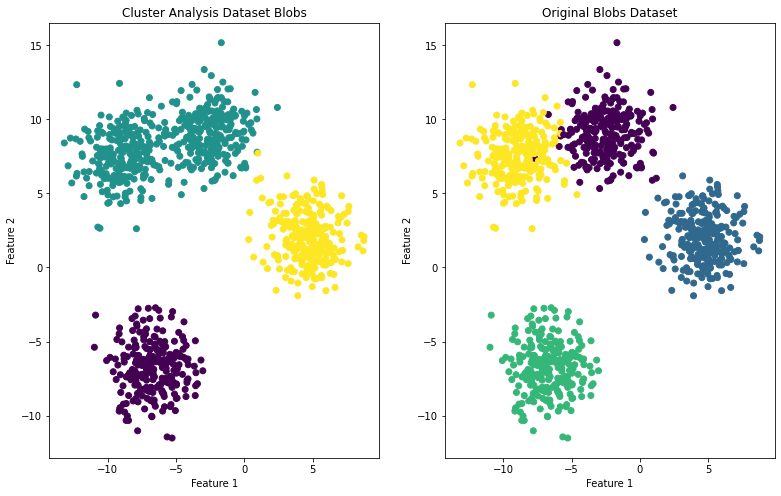

In [224]:
model = KMeans(n_clusters=3)
kmeansFinal = model.fit_predict(X)

fig,axes = plt.subplots(1, 2, figsize=(13, 8))
axes[0].scatter(df_blobs["1"],df_blobs["2"], c=kmeansFinal)
axes[1].scatter(df_blobs["1"],df_blobs["2"], c=df_blobs["y"])
axes[0].set(xlabel="Feature 1", ylabel="Feature 2", title ="Cluster Analysis Dataset Blobs")
axes[1].set(xlabel="Feature 1", ylabel="Feature 2", title ="Original Blobs Dataset")

plt.show()

Probamos con 4:

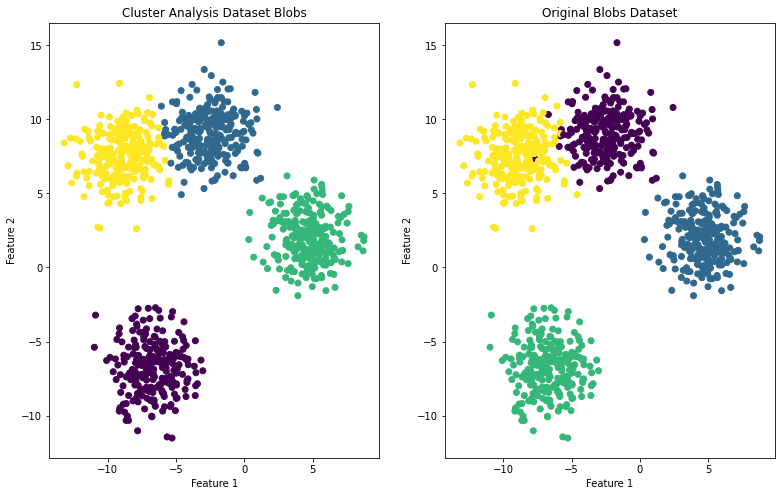

In [225]:
model = KMeans(n_clusters=4)
kmeansFinal = model.fit_predict(X)

fig,axes = plt.subplots(1, 2, figsize=(13, 8))
axes[0].scatter(df_blobs["1"],df_blobs["2"], c=kmeansFinal)
axes[1].scatter(df_blobs["1"],df_blobs["2"], c=df_blobs["y"])
axes[0].set(xlabel="Feature 1", ylabel="Feature 2", title ="Cluster Analysis Dataset Blobs")
axes[1].set(xlabel="Feature 1", ylabel="Feature 2", title ="Original Blobs Dataset")

plt.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado. 
</div>

El modelo Kmeans con 3 Clusters ha agrupado como uno solo las dos nubes cercanas que se encuentran en la parte superior izquierda, es decir con puntajes negativos en Feature 1 y puntajes altos en Feature 2. A la derecha podemos observar los resultados del modelo y a la izquierda los datos originales.

En ambos casos los clusters son los esperados.

In [226]:
X, y = X_moons, y_moons

In [227]:
X.shape

(1000, 2)

<div class="alert alert-block alert-info">
    <strong>Implementación:</strong> cálculo y visualización de la regla del codo en el dataset Moons.
</div>

C:\Users\vicju\anaconda3\envs\uoc20212pec2\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.



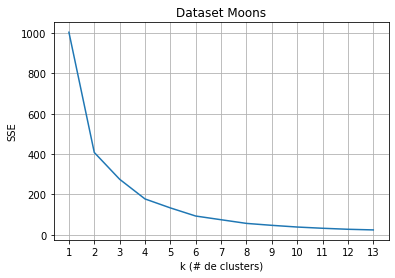

In [228]:
plot_Elbow_SSE(X, 14, "Moons")

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué se interpreta en la gráfica? ¿Cómo podría mejorarse la elección de $k$?.  
</div>

Según el método del codo el número ideal de cluster sería 2. Utilizamos el método del score de Silhoutte para verificarlo. Sin embargo acá tenemos resultados contradictorios, porque de 6 clusters en adelante observamos los valores mayores. Teniendo en cuenta ambos criterios, un menor nivel de error bajo y un score de Silhoutte tendiendo a 1, elegimos 2 como el número de clusters para realizar el modelo para el dataser Moons.

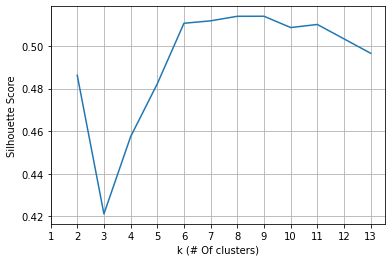

In [229]:
silhouetteGraph(14,X)

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> cálculo y visualización de los grupos en el dataset Moons.
</div>

In [230]:
df_moons = pd.DataFrame(X, columns = ["1", "2"])
df_moons["y"] = y
df_moons.head()

,1,2,y
0,-0.033411,0.421391,1
1,0.998827,-0.442890,1
2,0.889592,-0.327843,1
3,0.341958,-0.417690,1
4,-0.838531,0.532375,0


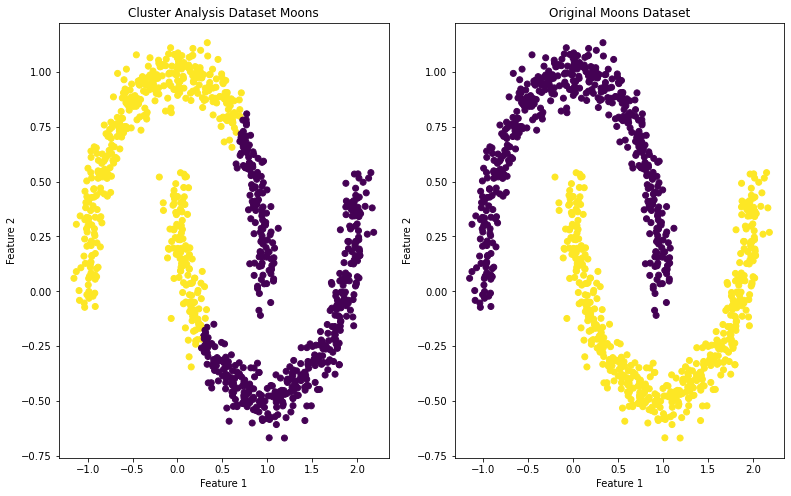

In [231]:
df_moons = pd.DataFrame(X, columns = ["1", "2"])
df_moons["y"] = y

model = KMeans(n_clusters=2)
kmeansFinal = model.fit_predict(X)

fig,axes = plt.subplots(1, 2, figsize=(13, 8))
axes[0].scatter(df_moons["1"],df_moons["2"], c=kmeansFinal)
axes[1].scatter(df_moons["1"],df_moons["2"], c=df_moons["y"])
axes[0].set(xlabel="Feature 1", ylabel="Feature 2", title ="Cluster Analysis Dataset Moons")
axes[1].set(xlabel="Feature 1", ylabel="Feature 2", title ="Original Moons Dataset")

plt.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

Observamos que los agrupamientos se solapan y distan de las agrupaciones originales. Esto sucede porque el algoritmo tiene un pobre rendimiento si los clusters tienen formas complejas, esta explicación es según Muller y Guido (2016). Estos mismos autores comentan que Kmean no es capaz de establecer en este caso, una línea divisoria entre los clusters y por eso falla al momento de reconocer el patrón de las lunas

### Referencias

- Muller, A.C & Guido, S.(2016). Machine Learning with Python: Unsupervised Learning and Preprocessing .O`Reilly Media.

In [232]:
X, y = X_circles, y_circles

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> cálculo y visualización de la regla del codo en el dataset Circles.
</div>

C:\Users\vicju\anaconda3\envs\uoc20212pec2\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.



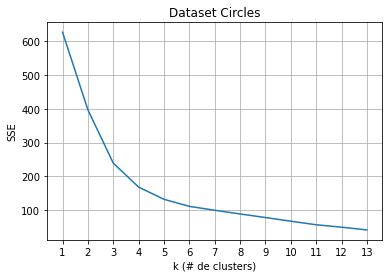

In [233]:
plot_Elbow_SSE(X, 14, "Circles")

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué se interpreta en la gráfica? ¿Cómo podría mejorarse la elección de $k$?.  
</div>

Teniendo en cuenta el método del codo tenemos que el número ideal de Clusters es 3, podemos mejorar la elección teniendo en cuenta el score de Silhoutte, los mayores valores de la métrica se encuentran de 8 agrupaciones en adelante

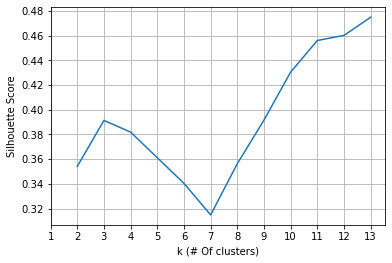

In [234]:
silhouetteGraph(14,X)

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> cálculo y visualización de los grupos en el dataset Circles.
</div>

In [235]:
df_circles = pd.DataFrame(X, columns = ["1", "2"])
df_circles["y"] = y
df_circles.head()

,1,2,y
0,0.452592,0.168433,1
1,-0.438027,0.119900,1
2,-0.532224,0.184359,1
3,-0.301402,0.400782,1
4,0.445602,-0.894936,0


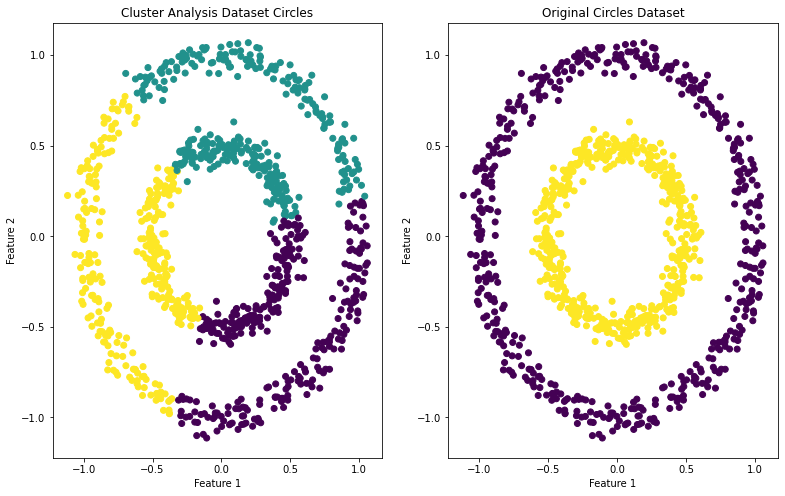

In [236]:
model = KMeans(n_clusters=3)
kmeansFinal = model.fit_predict(X)

fig,axes = plt.subplots(1, 2, figsize=(13, 8))
axes[0].scatter(df_circles["1"],df_circles["2"], c=kmeansFinal)
axes[1].scatter(df_circles["1"],df_circles["2"], c=df_circles["y"])
axes[0].set(xlabel="Feature 1", ylabel="Feature 2", title ="Cluster Analysis Dataset Circles")
axes[1].set(xlabel="Feature 1", ylabel="Feature 2", title ="Original Circles Dataset")

plt.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

Pasa algo similar en el dataser Moons. El algoritmo no funciona o no es sensible a formas complejas en los agrupamientos.

### 1 b. Algoritmos basados en densidad: DBSCAN

En este apartado se pide aplicar clustering por densidad como [DBSCAN](https://en.wikipedia.org/wiki/DBSCAN) a los datasets anteriores para detectar los dos grupos subyacentes.

Ésta es una visualización intuitiva de su funcionamiento: https://www.youtube.com/watch?v=RDZUdRSDOok

In [237]:
X, y = X_blobs, y_blobs

In [238]:
df_blobs = pd.DataFrame(X, columns = ["1", "2"])
df_blobs["y"] = y
df_blobs.sample(2)

,1,2,y
753,-9.525211,6.215649,3
640,-9.817158,7.264264,3


<div class="alert alert-block alert-info">
<strong>Implementación:</strong> prueba la implementación de <a href="http://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html">DBSCAN en scikit-learn</a> jugando con los parámetros <i>eps</i> y <i>min_samples</i> para encontrar los grupos (y <i>outliers</i>) del dataset Blobs.
</div>

In [239]:
from sklearn.cluster import DBSCAN

Definimos una función para probar diferentes valores de los hiperparámetros:

In [240]:
def DBSCAN_grid_search(X,y,eps,min_samples,nameDataset):
    model = DBSCAN(eps=eps, min_samples=min_samples)
    model.fit(X)
    
    fig,axes = plt.subplots(1, 2, figsize=(13, 8))
    axes[0].scatter(X[:,0],X[:,1], c=model.labels_)
    axes[1].scatter(X[:,0],X[:,1], c=y)
    
    axes[0].set(xlabel="Feature 1", ylabel="Feature 2", title ="Clustering with DBSCAN, eps: {}, min_samples: {}".format(eps,min_samples))
    axes[1].set(xlabel="Feature 1", ylabel="Feature 2", title ="Original " + nameDataset)
    plt.show()

Para tener una aproximación de los valores a probar en el caso de Epsilon, utilizaremos el método del codo con el algoritmo de vacinos cercanos.
Esta técnica consiste en calcular la distancia promedio entre cada punto y sus k vecinos más cercanos.
Los valores óptimos de Epsilon se encuentran en la curvatura


### Referencias:

- Kumar, V. (2021). Tutorial for DBSCAN Clustering in Python Sklearn. https://machinelearningknowledge.ai/tutorial-for-dbscan-clustering-in-python-sklearn/#Finding_the_Optimal_value_of_Epsilon

- Masoud A. (2020). How to determine epsilon and MinPts parameters of DBSCAN clustering: http://www.sefidian.com/2020/12/18/how-to-determine-epsilon-and-minpts-parameters-of-dbscan-clustering/

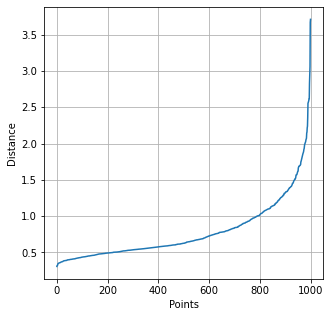

In [241]:
from sklearn.neighbors import NearestNeighbors

nearest_neighbors = NearestNeighbors(n_neighbors=11)
neighbors = nearest_neighbors.fit(df_blobs)

distances, indices = neighbors.kneighbors(df_blobs)
distances = np.sort(distances[:,10], axis=0)

fig = plt.figure(figsize=(5, 5))
plt.plot(distances)
plt.xlabel("Points")
plt.ylabel("Distance")
plt.grid()
plt.show()

Generamos una lista de posibles valores de Epsilon

In [242]:
epsilon_values = [round(i,3) for i in np.arange(0.30, 1.5, 0.10)]
epsilon_values

[0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4]

------


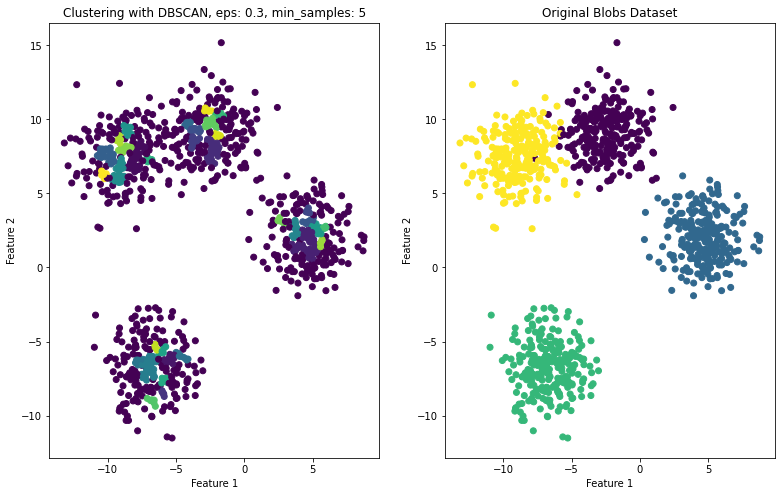

------


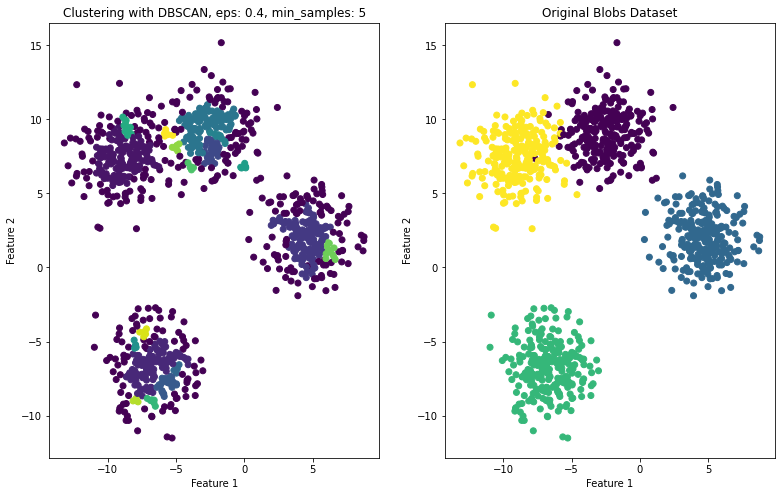

------


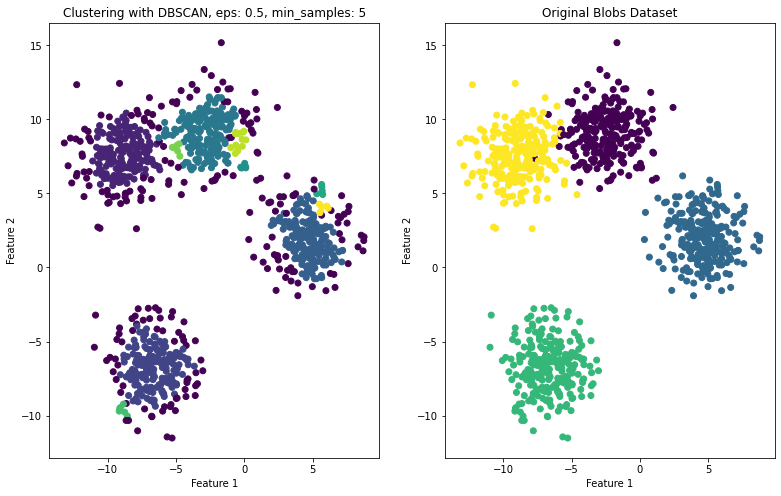

------


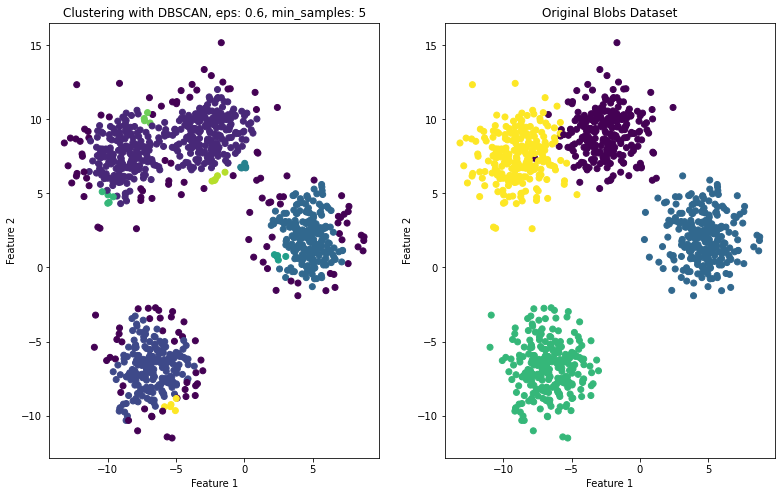

------


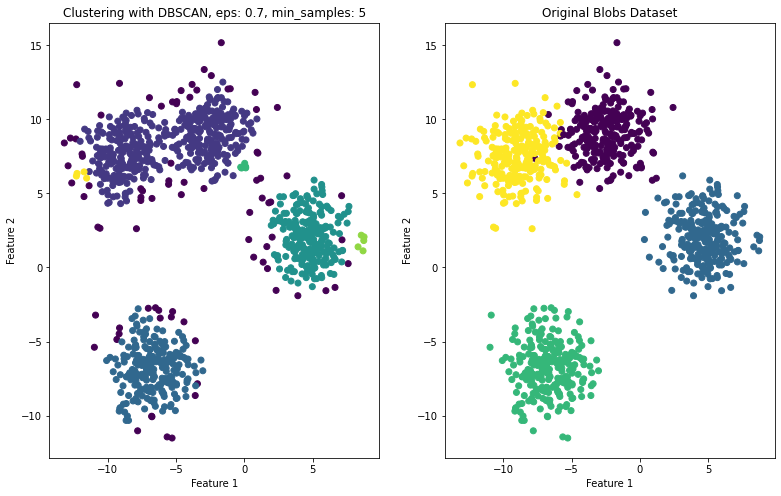

------


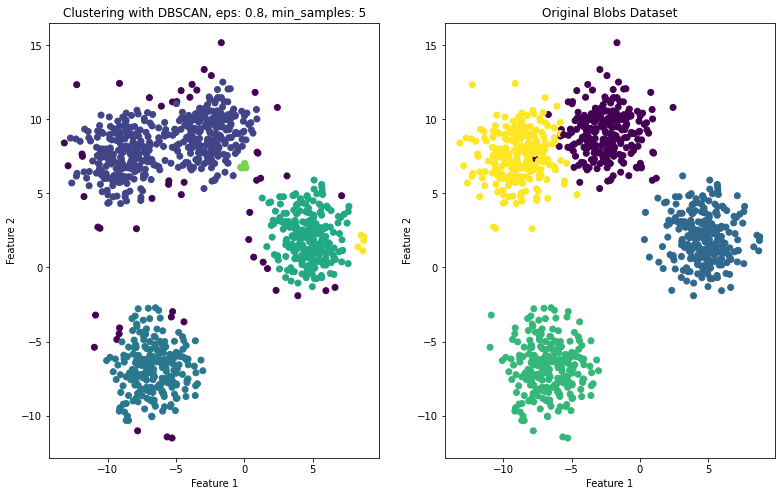

------


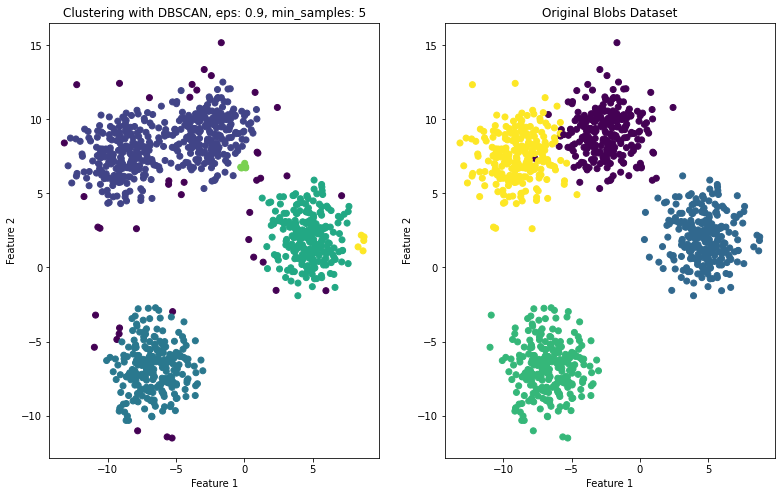

------


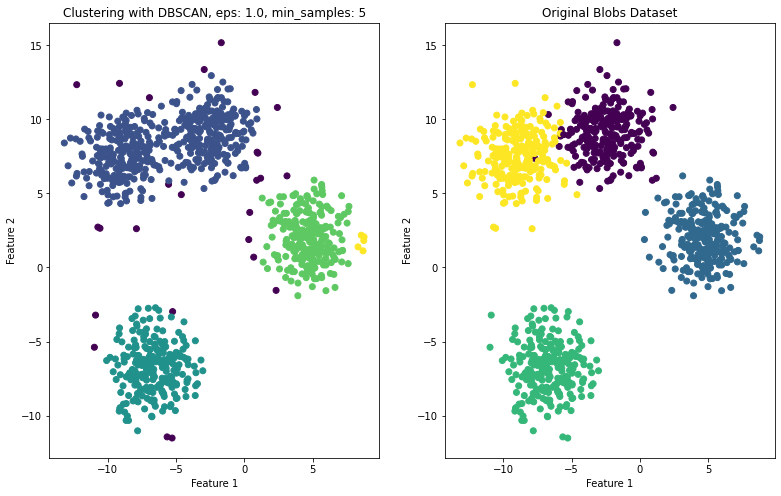

------


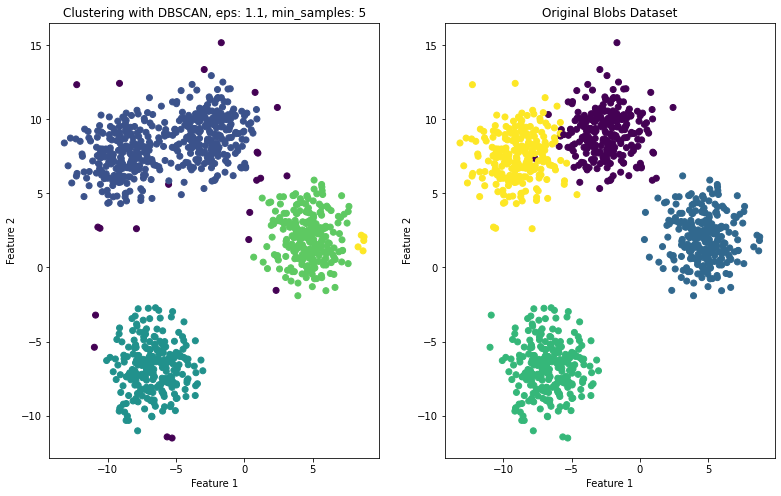

------


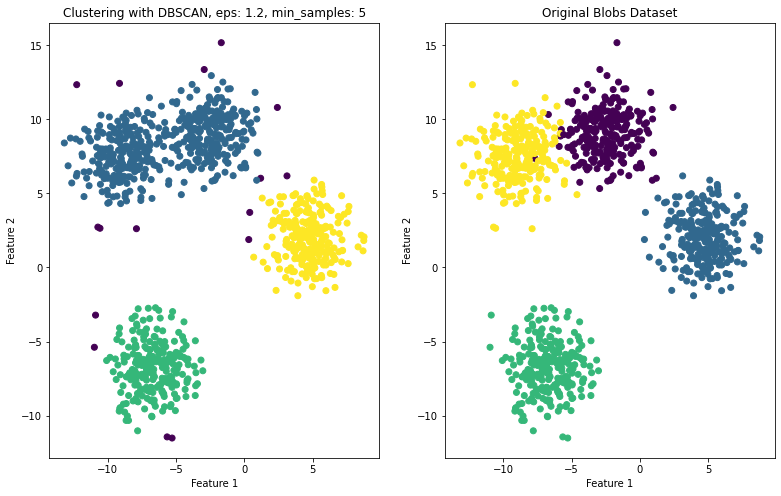

------


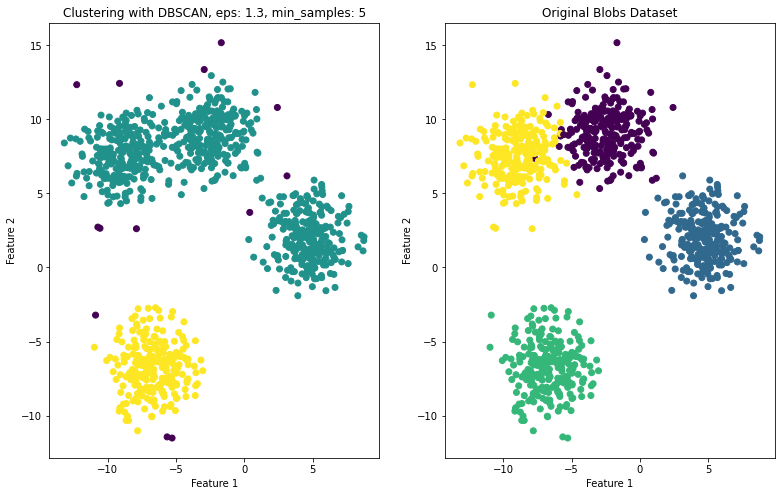

------


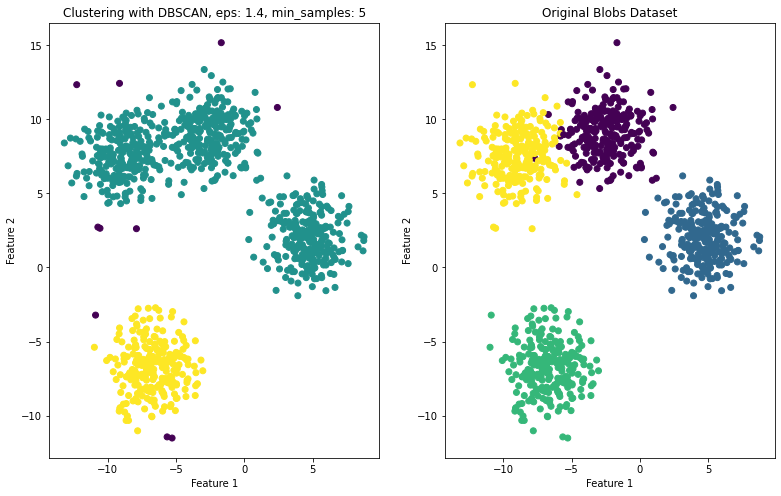

In [243]:
for i in epsilon_values:
    print("------")
    DBSCAN_grid_search(X,y,i,5,"Blobs Dataset")

Probamos con el otro parámetro: min_samples

In [244]:
min_samples = list(range(2,10))
min_samples

[2, 3, 4, 5, 6, 7, 8, 9]

Consideremos el valor de 1.20 para Epsilon debido a que nos acerca a 3 clusters

------


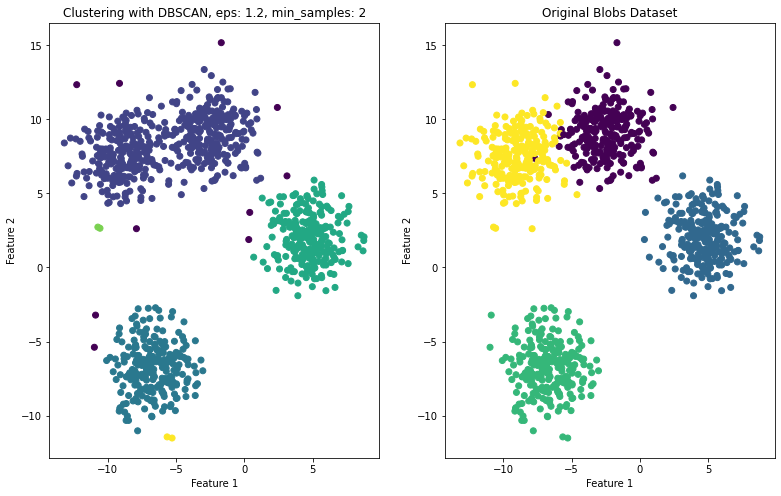

------


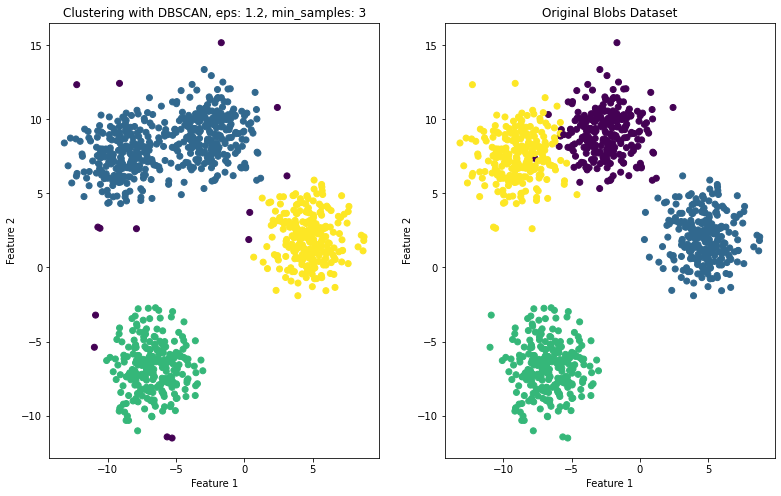

------


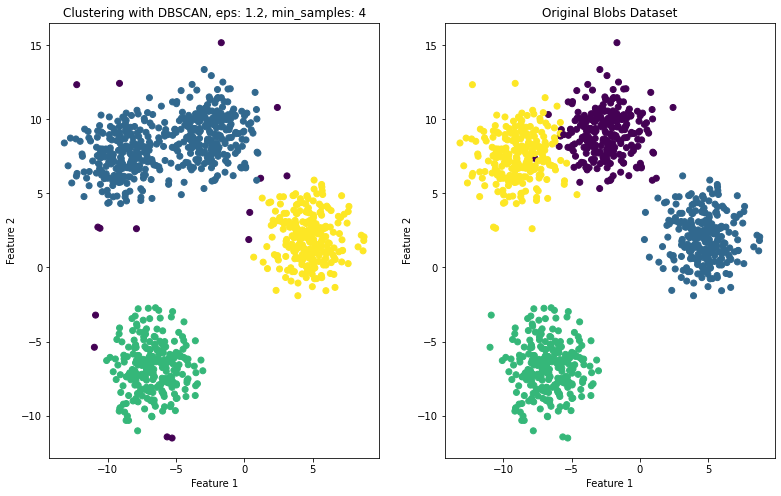

------


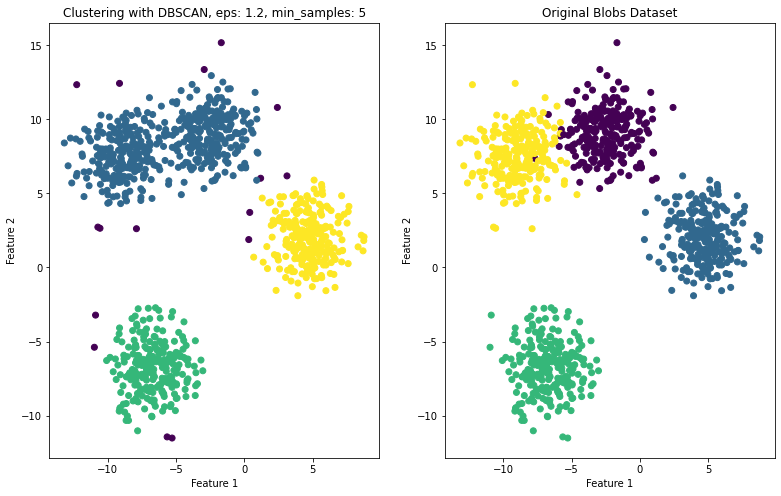

------


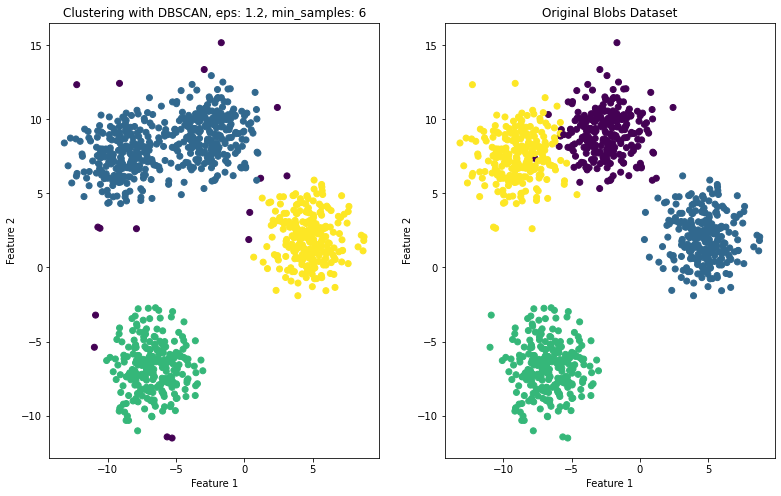

------


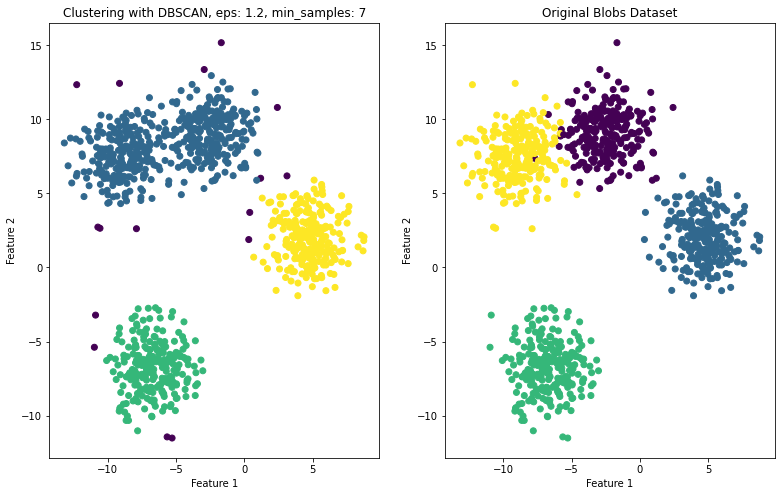

------


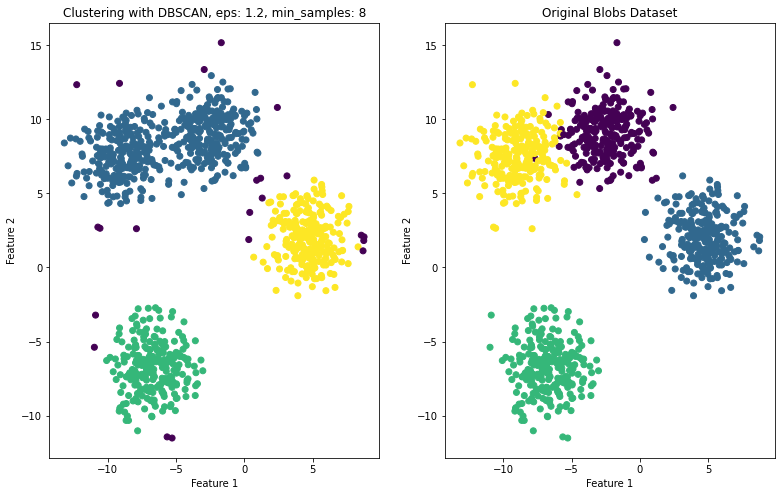

------


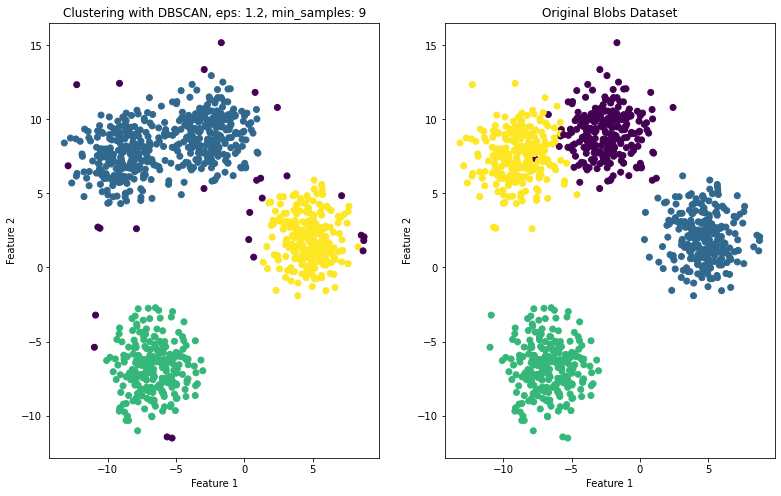

In [245]:
for i in min_samples:
    print("------")
    DBSCAN_grid_search(X,y,1.20,i, "Blobs Dataset")

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

Los hiperparámetros que tuvieron una performance cercana al dataset orginal son, un Epsilon de 1.2 con min_samples de 5,6 o 7. El algoritmo deja muchos puntos como outliers y realiza agrupamientos pequeños e incorrectos pero se acerca a indentificar los clusters originales

In [246]:
X, y = X_moons, y_moons
df_moons = pd.DataFrame(X, columns = ["1", "2"])
df_moons["y"] = y
df_moons.sample(2)

,1,2,y
506,0.624067,-0.431650,1
493,0.771332,0.642804,0


<div class="alert alert-block alert-info">
<strong>Implementación:</strong> prueba la implementación de DBSCAN jugando con los parámetros <i>eps</i> y <i>min_samples</i> para encontrar los grupos (y <i>outliers</i>) del dataset Moons.
</div>

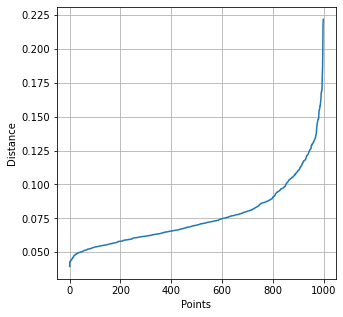

In [247]:
nearest_neighbors = NearestNeighbors(n_neighbors=11)
neighbors = nearest_neighbors.fit(df_moons)

distances, indices = neighbors.kneighbors(df_moons)
distances = np.sort(distances[:,10], axis=0)

fig = plt.figure(figsize=(5, 5))
plt.plot(distances)
plt.xlabel("Points")
plt.ylabel("Distance")
plt.grid()
plt.show()

In [248]:
epsilon_values = [round(i,3) for i in np.arange(0.060, 0.165, 0.015)]
epsilon_values

[0.06, 0.075, 0.09, 0.105, 0.12, 0.135, 0.15, 0.165]

-------


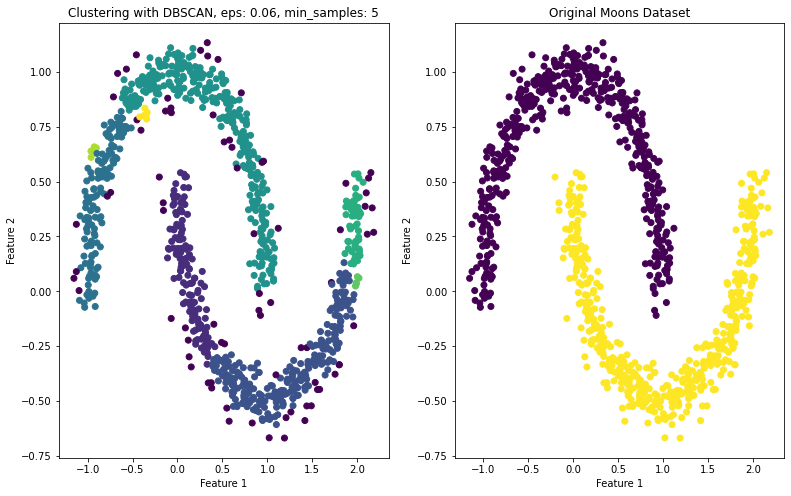

-------


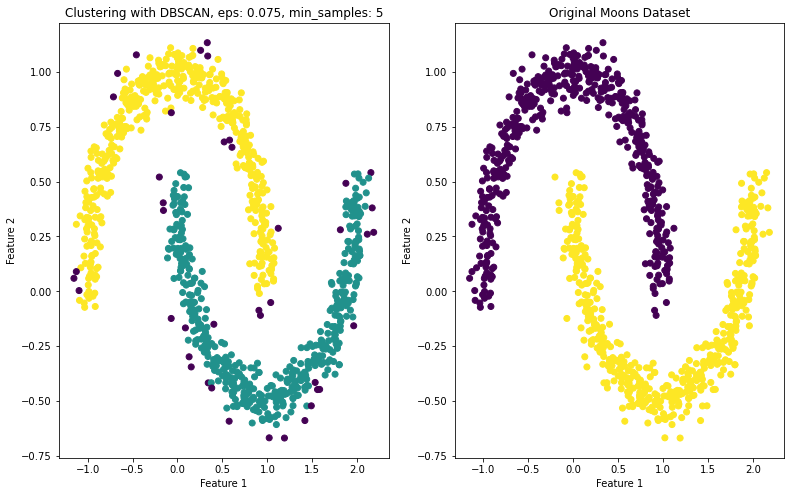

-------


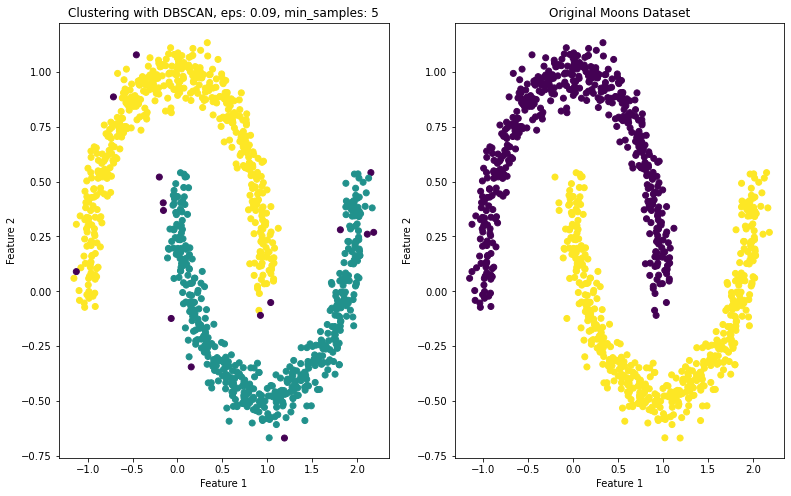

-------


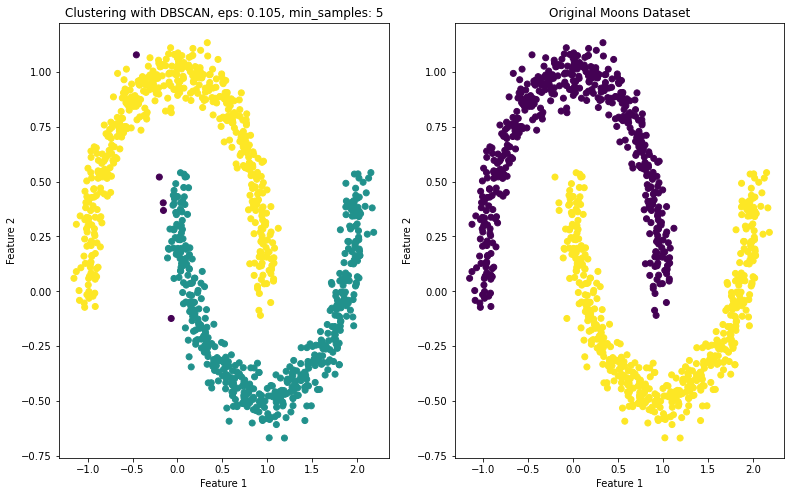

-------


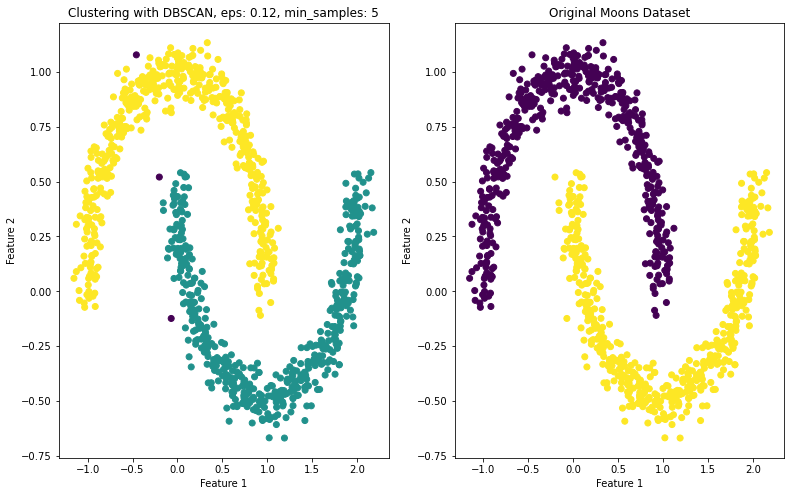

-------


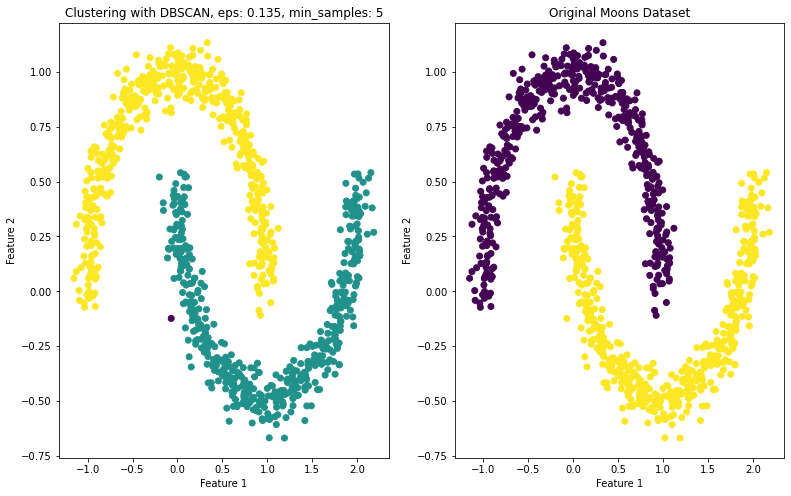

-------


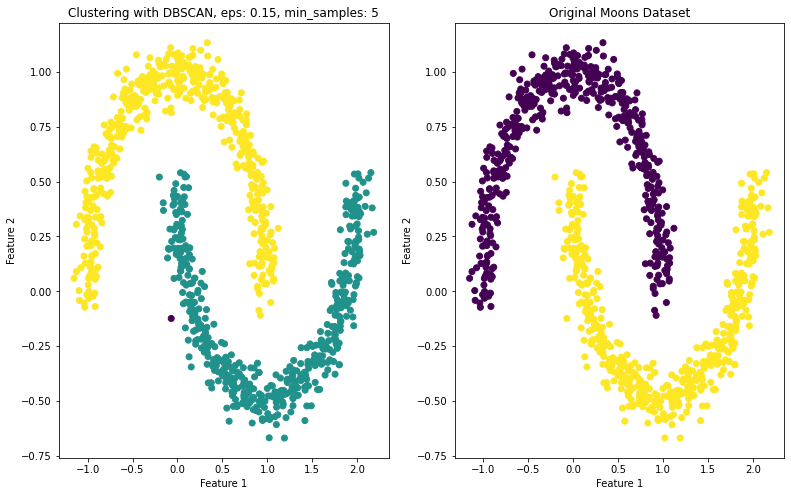

-------


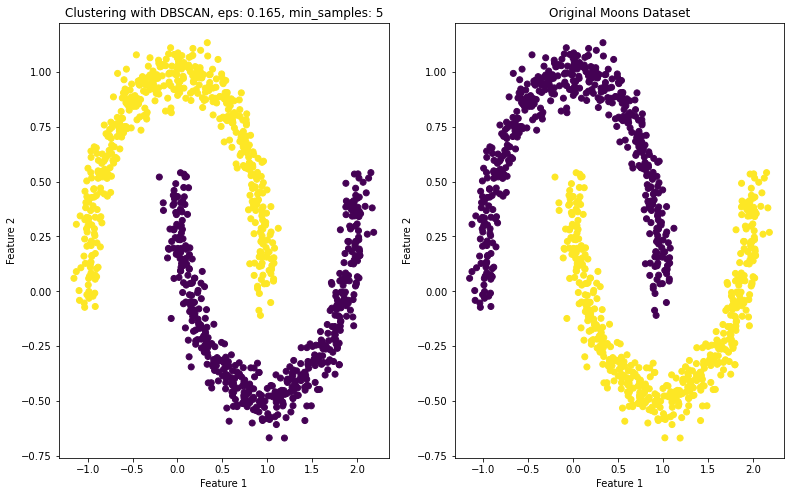

In [249]:
for i in epsilon_values:
    print("-------")
    DBSCAN_grid_search(X,y,i,5, "Moons Dataset")    

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

En el caso del dataset moons, el algoritmo es capaz de reconocer correctamente los dos clusters. Esto se debe a que DBSCAN es un algoritmo que tiene como ventajas la capacidad de detectar formas geométricamente complejas en los clusters y la robustez ante los valores outlier. 

DBSCAN funciona detectando regiones con puntos de alta densidad y a partir de ahí construye los clusters a diferencia del Kmeans que determina los centroides y luego asigna las observaciones a los clusters

### Referencia

A. Fernández Jauregui. DBSCAN en Python. https://anderfernandez.com/blog/dbscan-python/

In [250]:
X, y = X_circles, y_circles
df_circles = pd.DataFrame(X, columns = ["1", "2"])
df_circles["y"] = y
df_circles.sample(2)

,1,2,y
699,-0.381420,0.908919,0
406,0.249247,-0.402330,1


<div class="alert alert-block alert-info">
<strong>Implementación:</strong> prueba la implementación de DBScan jugando con los parámetros <i>eps</i> y <i>min_samples</i> para encontrar los grupos (y <i>outliers</i>) del dataset Circles.
</div>

Realizamos un procedimiento similar al anteriormente ejecutado con moons.
Determinamos posibles valores de Epsilon

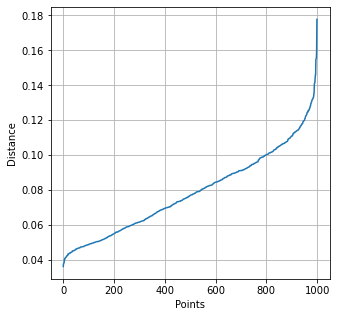

In [251]:
nearest_neighbors = NearestNeighbors(n_neighbors=11)
neighbors = nearest_neighbors.fit(df_circles)

distances, indices = neighbors.kneighbors(df_circles)
distances = np.sort(distances[:,10], axis=0)

fig = plt.figure(figsize=(5, 5))
plt.plot(distances)
plt.xlabel("Points")
plt.ylabel("Distance")
plt.grid()
plt.show()

In [252]:
epsilon_values = [round(i,3) for i in np.arange(0.060, 0.145, 0.015)]
epsilon_values

[0.06, 0.075, 0.09, 0.105, 0.12, 0.135]

-------


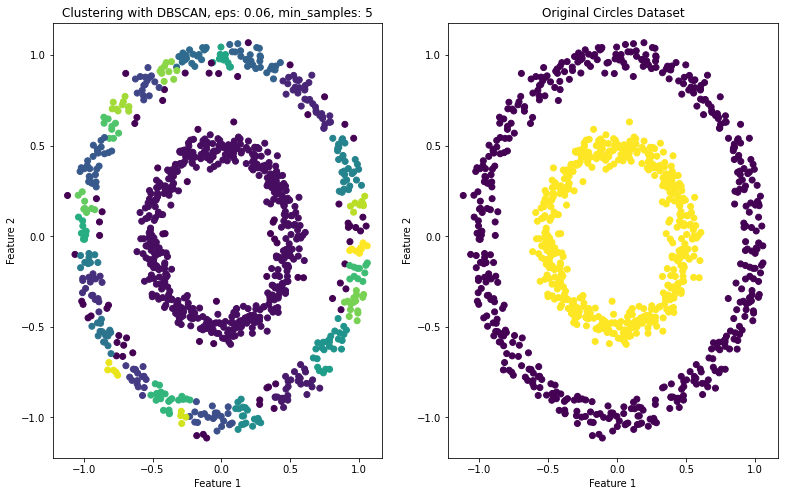

-------


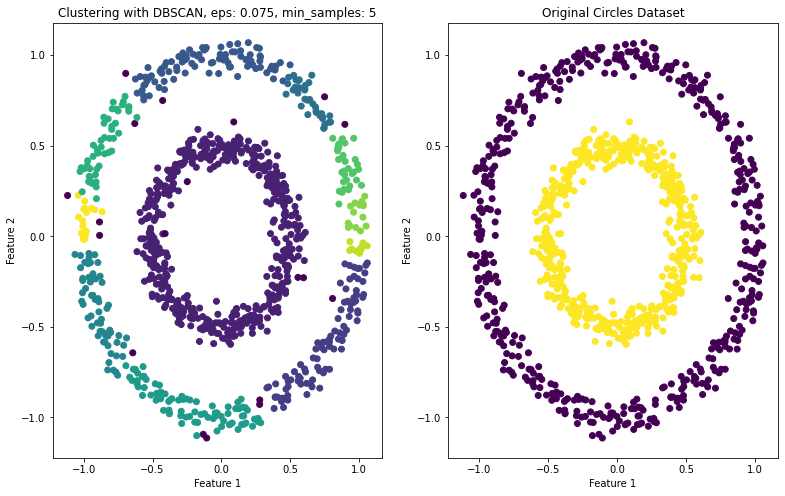

-------


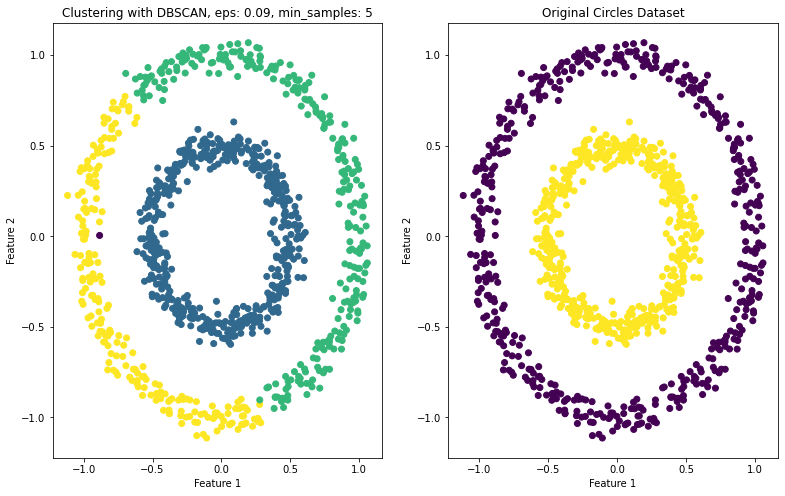

-------


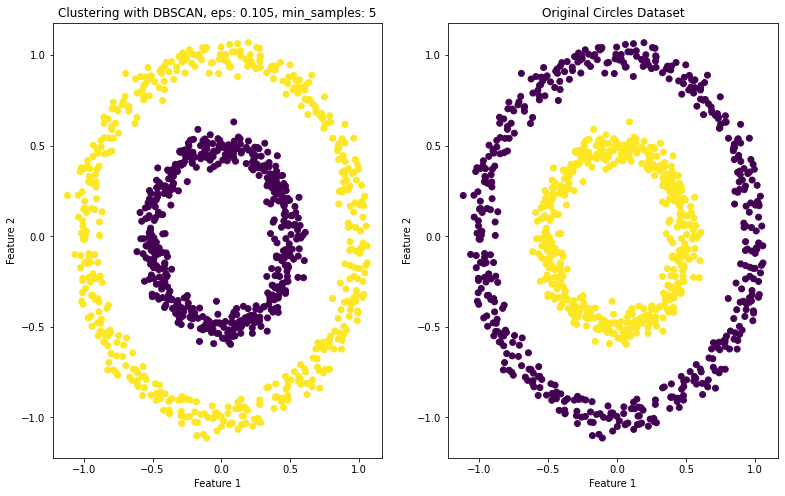

-------


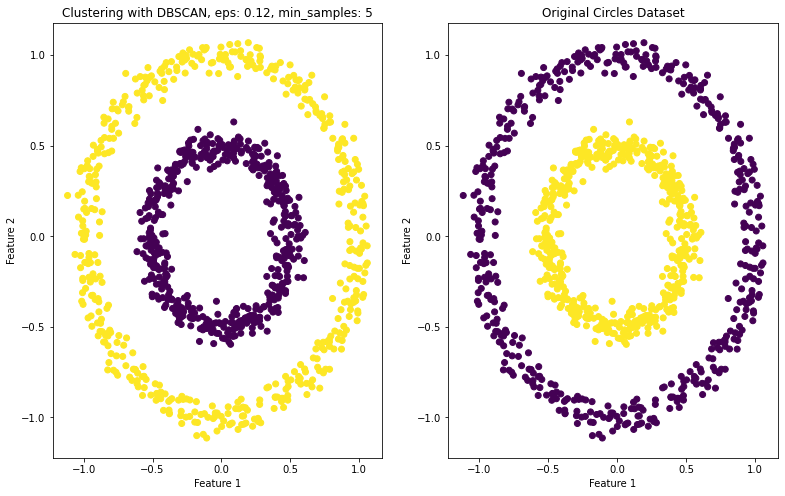

-------


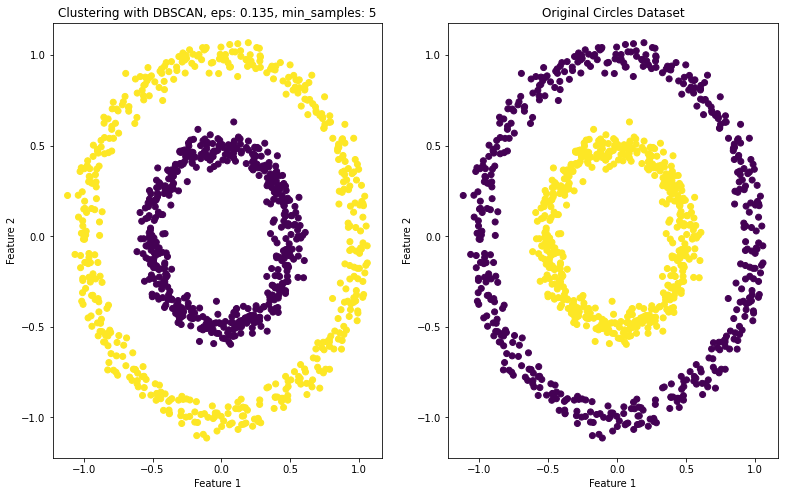

In [253]:
for i in epsilon_values:
    print("-------")
    DBSCAN_grid_search(X,y,i,5, "Circles Dataset")  

Solo configurando el valor de Epsilon ya obtenemos los clusters correctos, sin embargo probamos con min_samples

In [254]:
min_samples = list(range(2,10))
min_samples

[2, 3, 4, 5, 6, 7, 8, 9]

-------


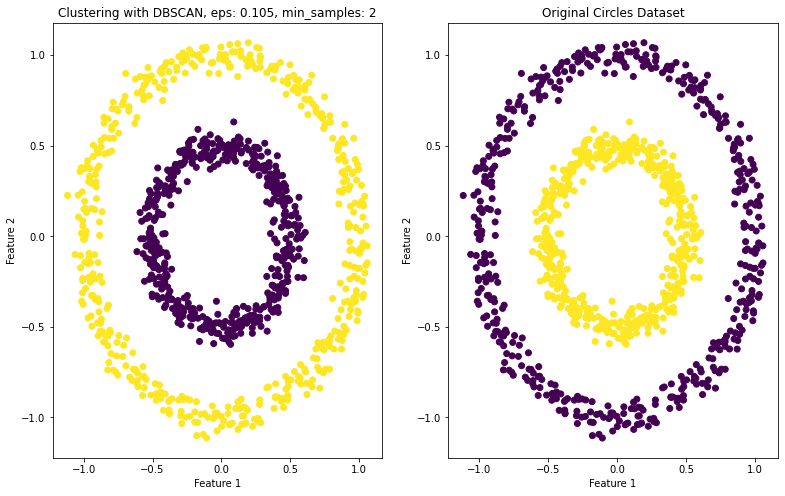

-------


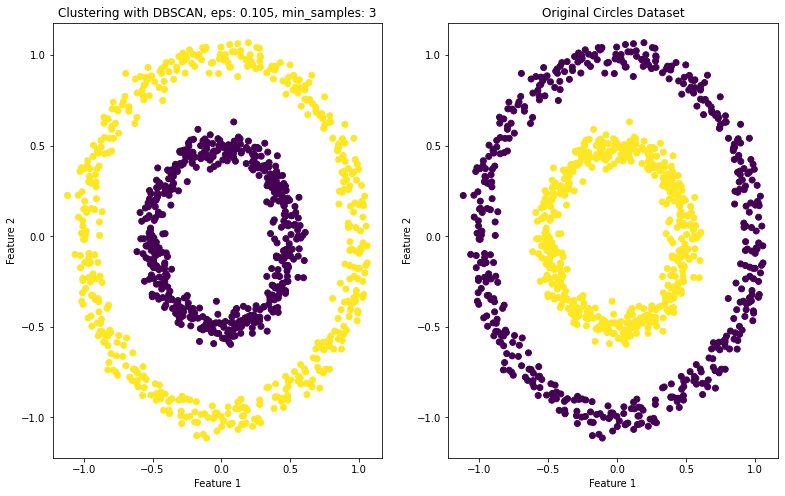

-------


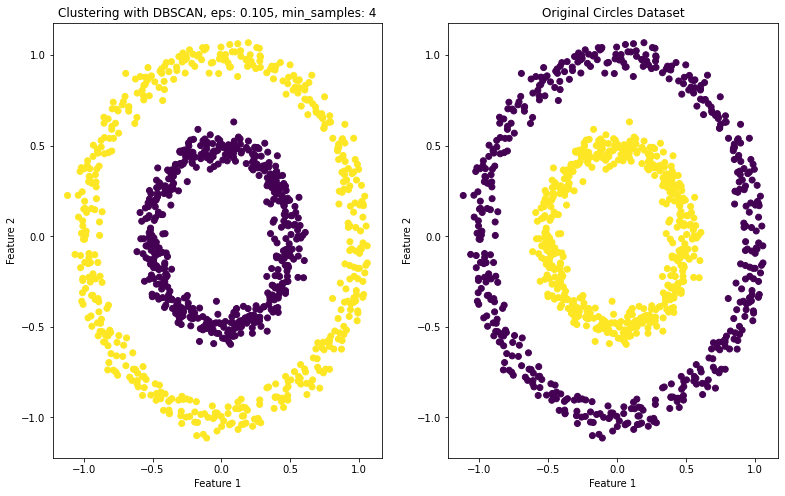

-------


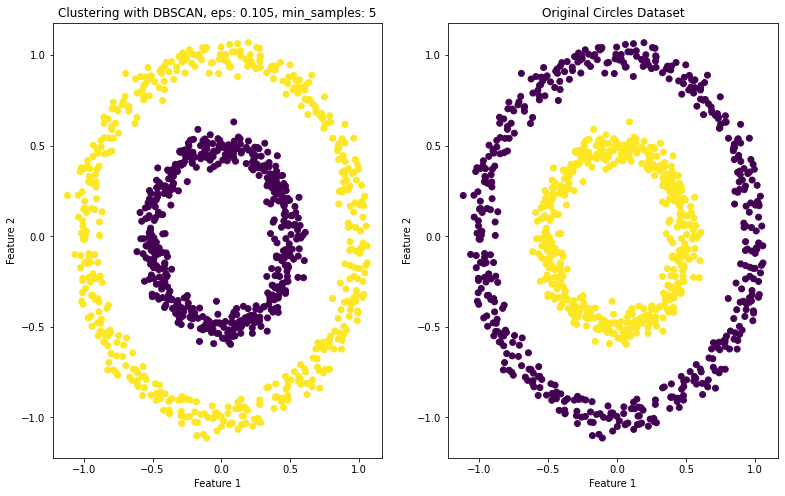

-------


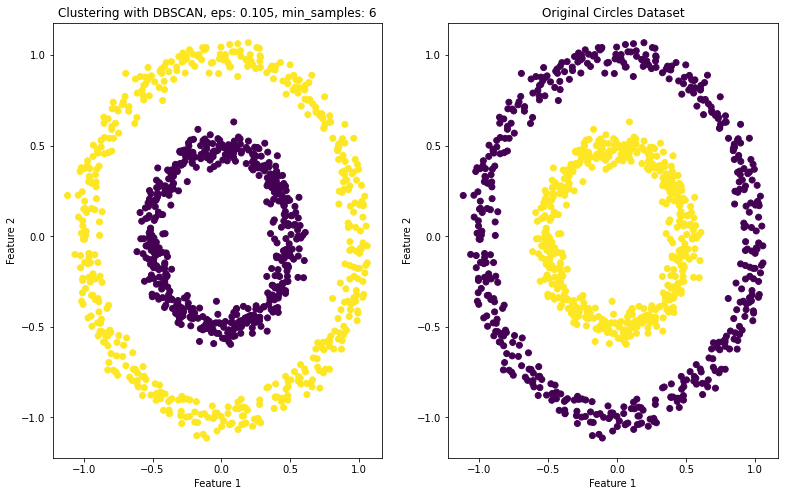

-------


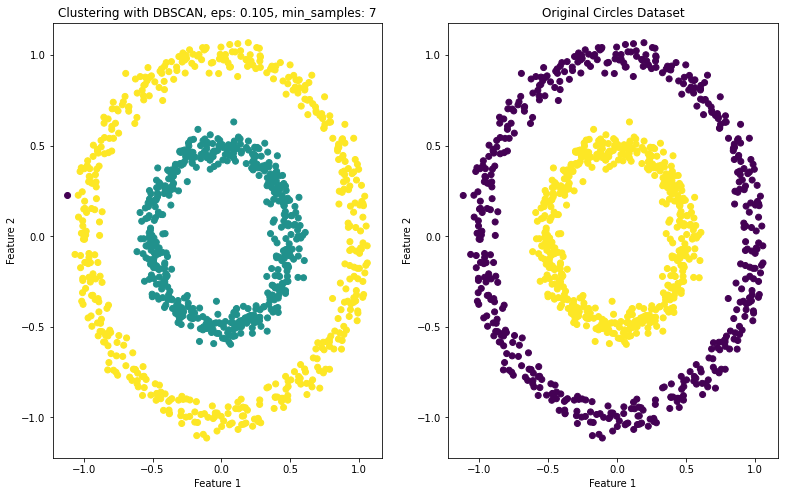

-------


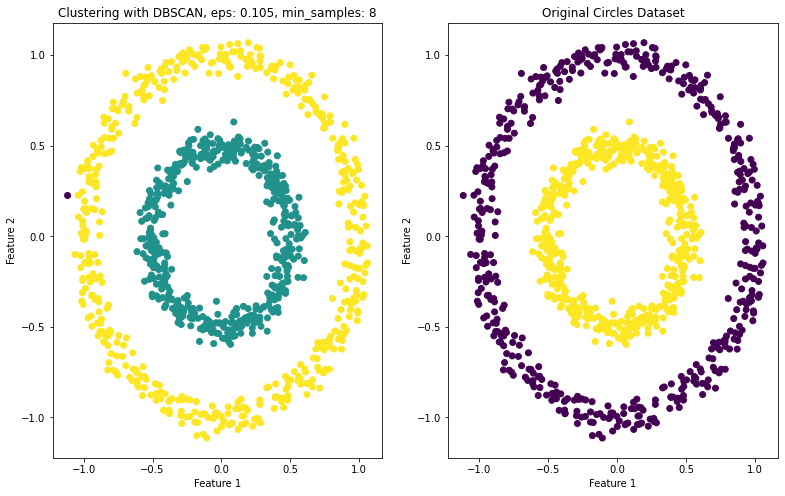

-------


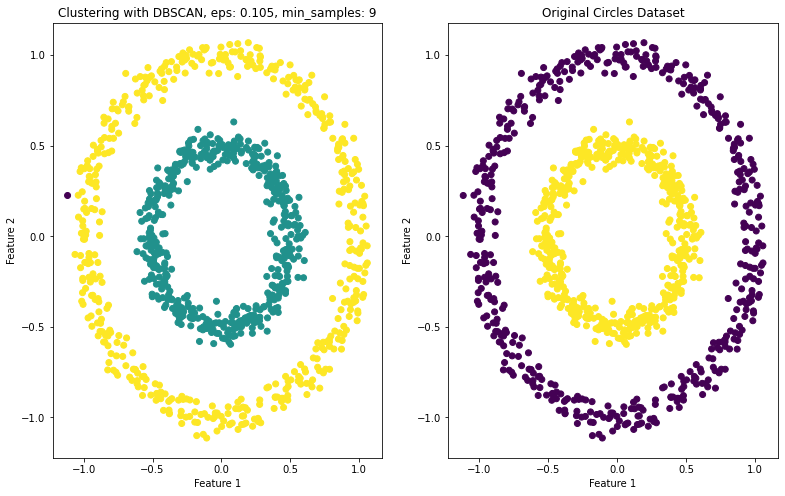

In [255]:
for i in min_samples:
    print("-------")
    DBSCAN_grid_search(X,y,0.105,i, "Circles Dataset")  

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

Con los parámetros de epsilon 0.105 y min_sample 2 el algoritmo identifica correctamente los dos circulos. Como se comento anteriormente, trabajando con los puntos de densidad DBSCAN es capaz de construir los clusters con formas complejas

### 1 c. Algoritmos jerárquicos

En este apartado se pide visualizar mediante un [dendrograma](https://en.wikipedia.org/wiki/Dendrogram) la construcción progresiva de los grupos mediante un algoritmo jerárquico aglomerativo (estrategia *bottom-up*). Con ello se pretende encontrar un método gráfico para entender el comportamiento del algoritmo y encontrar los *clusters* deseados en cada dataset.

In [256]:
X, y = X_blobs, y_blobs

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> prueba la implementación de <a href="https://docs.scipy.org/doc/scipy/reference/cluster.hierarchy.html">clustering jerárquico de scipy</a> probando distintos <a href="https://en.wikipedia.org/wiki/Hierarchical_clustering#Linkage_criteria">criterios de enlace o <i>linkage</i></a> permitiendo identificar los clusters subyacentes (mostrando su resultado) y su dendrograma para el dataset Blobs.<br>
Puedes importar las librerías necesarias para ello.
</div>

Definimos una lista de métodos a probar

In [257]:
methods = ['single','complete', 'average', 'weighted', 'centroid', 'median', 'ward']

Definimos una función génerica para probar diferentes métodos y datasets

In [258]:
import scipy.cluster.hierarchy as sch

def hCluster(method, dataX, dataY,dataName):
    fig, ax = plt.subplots(1, 3,figsize=(13, 8))
    #dendrogram(linkage(pdist(dataX), method), ax=ax[0])
    sch.dendrogram(sch.linkage(dataX, method = method), ax=ax[0])
    cluster_idx = sch.fcluster(sch.linkage(dataX,method = method), t=.2, criterion='distance')
    #cluster_idx = fcluster(linkage(pdist(data_circles[1]), 'single'), t=.2, criterion='distance')
    ax[1].scatter(dataX[:, 0], dataX[:, 1], c=cluster_idx)
    ax[2].scatter(dataX[:, 0], dataX[:, 1], c=dataY)

    
    ax[0].set_title('Dendogram for {} and method {}'.format(dataName, method))
    ax[1].set_title('Scatter plot with Clusters')
    ax[2].set_title('Scatter plot original data')
    plt.show()

------


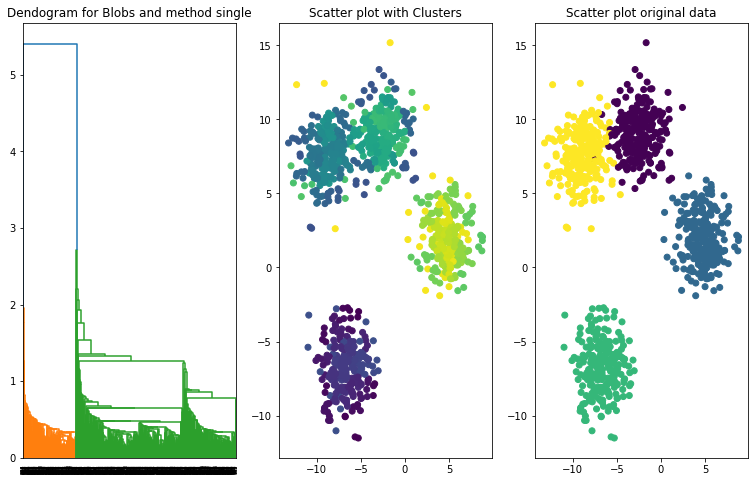

------


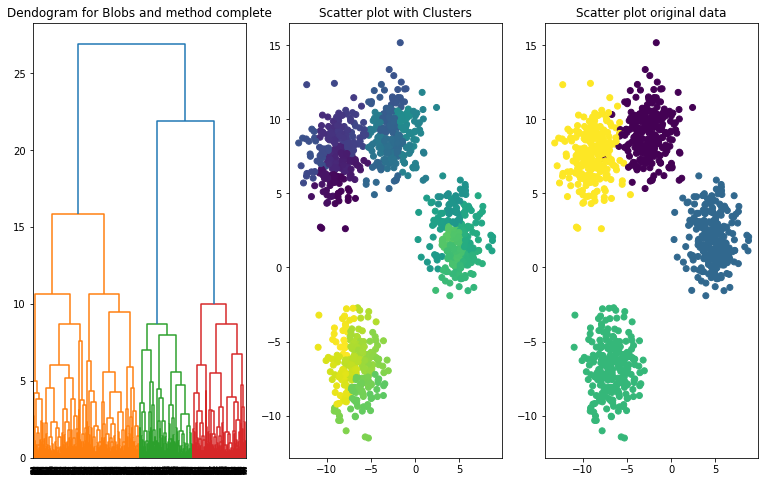

------


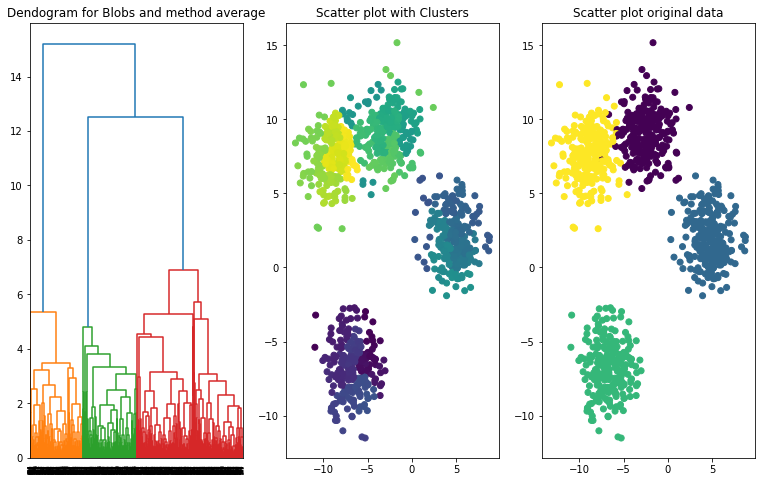

------


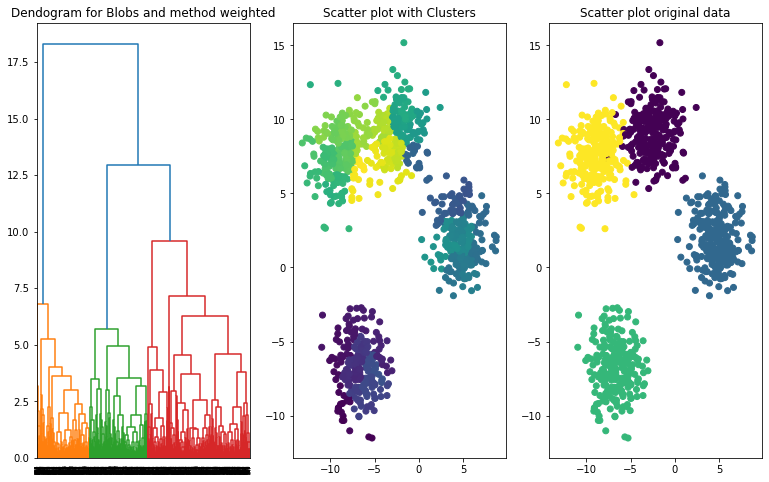

------


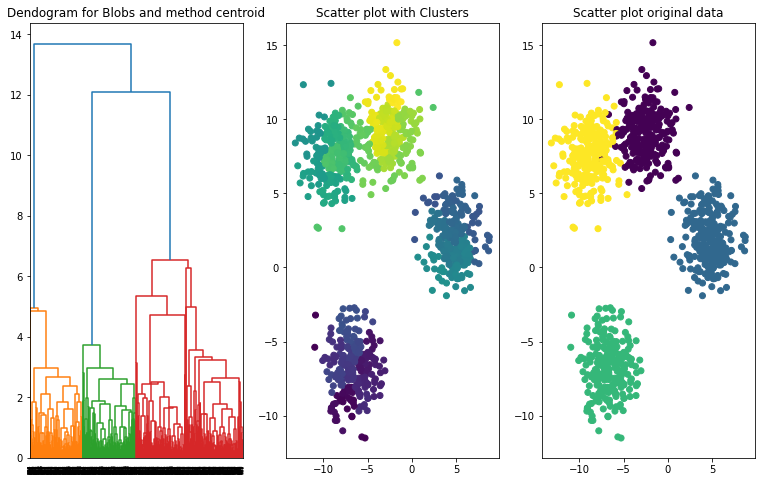

------


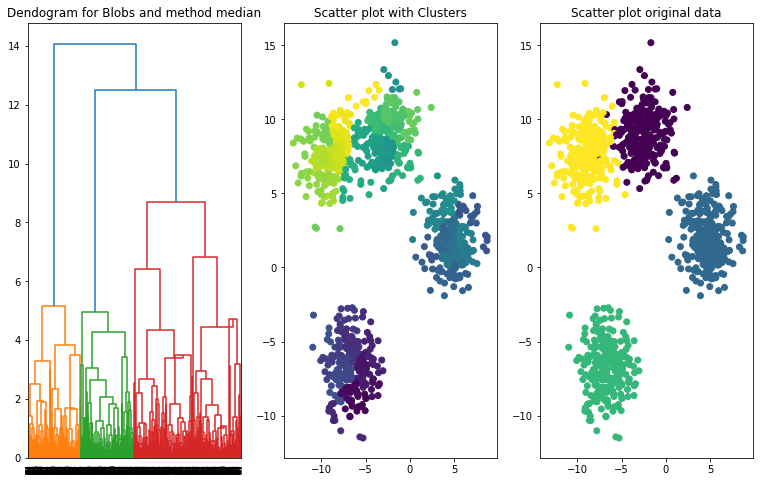

------


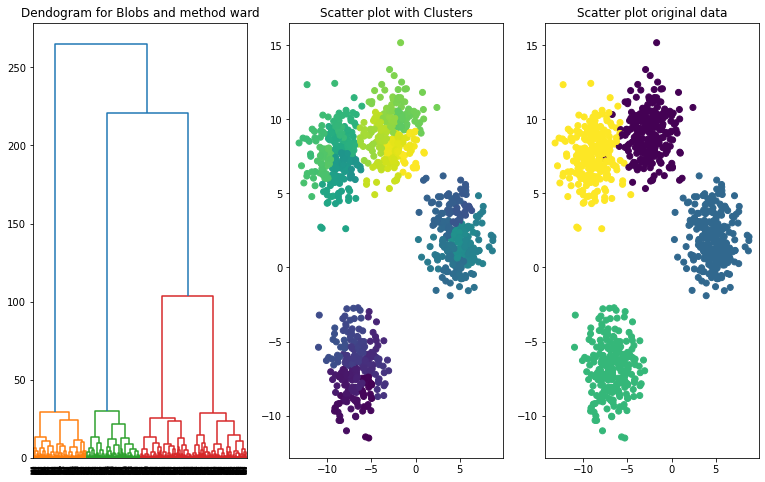

In [259]:
for i in methods:
    print('------')
    hCluster(i,X,y,'Blobs')

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> Interpreta el dendrograma y comenta qué criterio de enlace se ha comportado mejor. ¿Por qué?
</div>

Todos los tipos de enlace excepto el simple tienen como resultado 3 clusters. El criterio simple genera solamente 2. Ninguno de los enlaces probados puede replicar correctamente las agrupaciones, esto puede deberse principalmente por el solapamiento en las distancias de los dos clusters ubicados en la parte superior izquierda del scatter plot

In [260]:
X, y = X_moons, y_moons

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
prueba la implementación de <a href="https://docs.scipy.org/doc/scipy/reference/cluster.hierarchy.html">clustering jerárquico de scipy</a> probando distintos <a href="https://en.wikipedia.org/wiki/Hierarchical_clustering#Linkage_criteria">criterios de enlace o <i>linkage</i></a> permitiendo identificar los clusters subyacentes (mostrando su resultado) y su dendrograma para el dataset Moons.<br>
Puedes importar las librerías necesarias para ello.
</div>

------


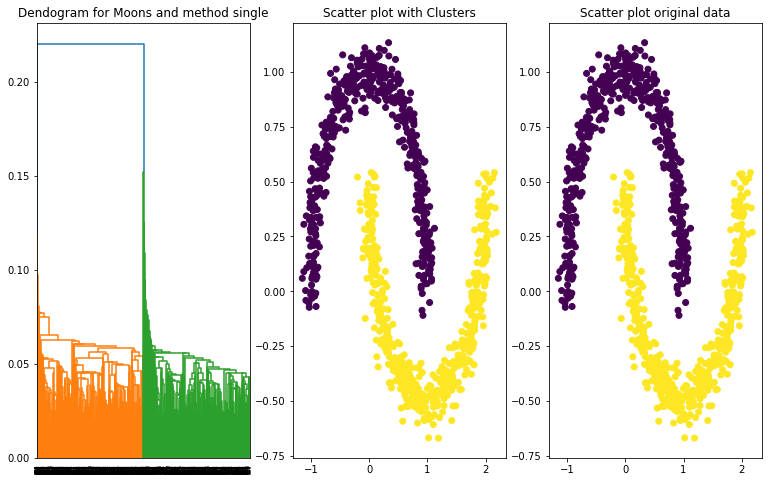

------


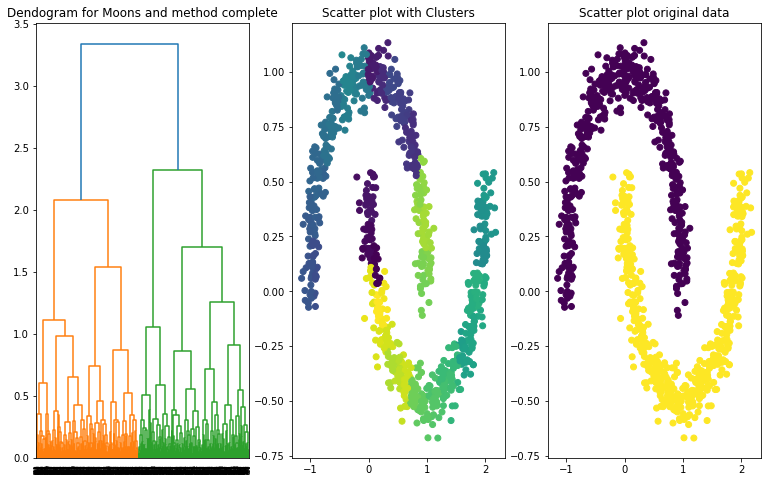

------


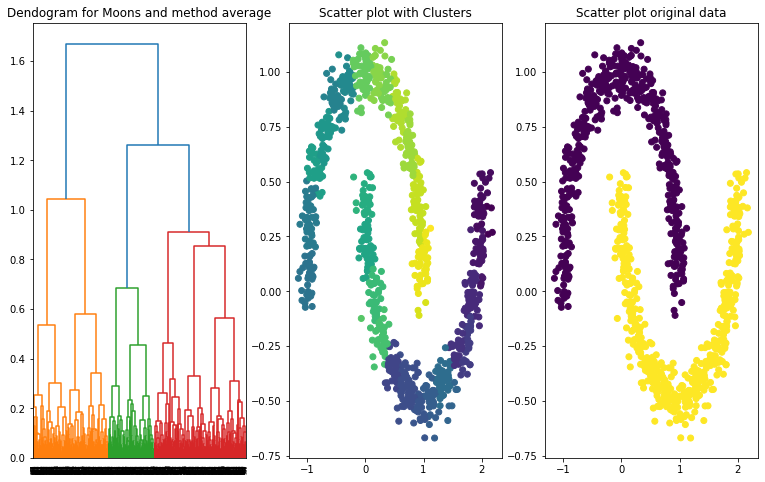

------


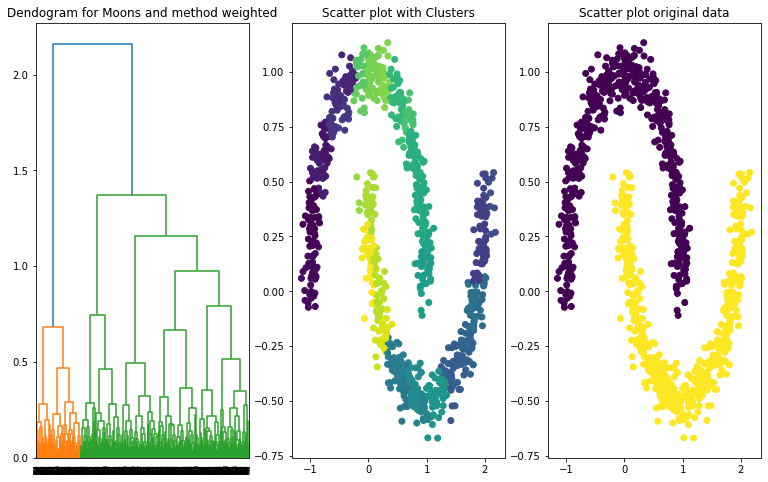

------


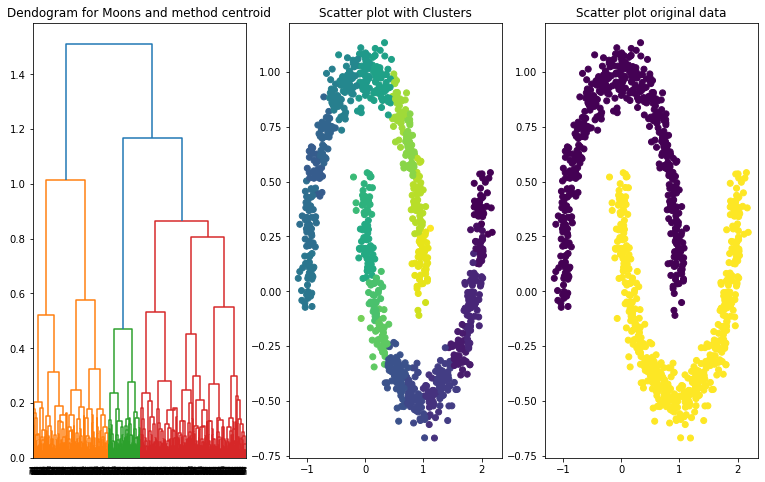

------


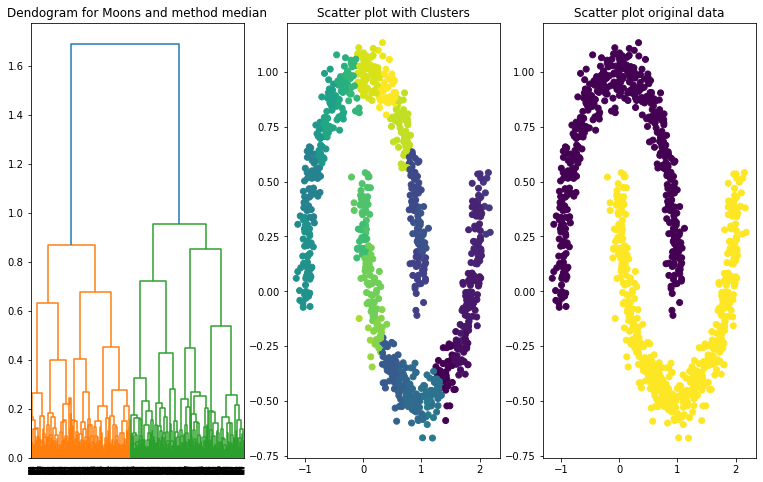

------


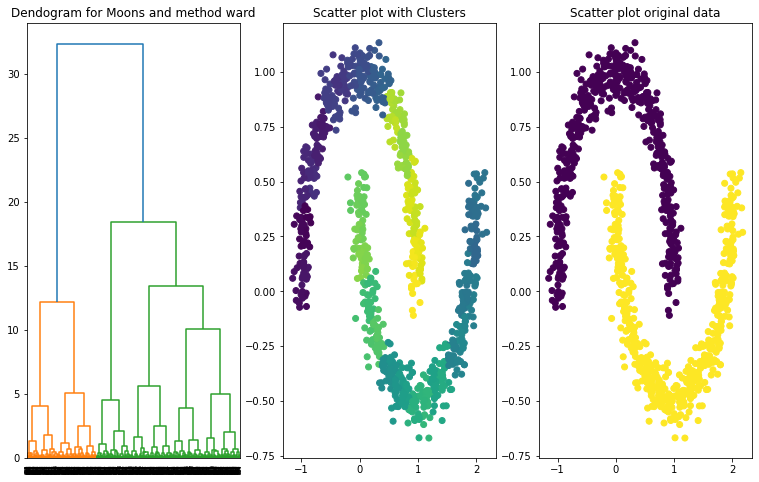

In [261]:
for i in methods:
    print('------')
    hCluster(i,X,y,'Moons')

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> Interpreta el dendrograma y comenta qué criterio de enlace se ha comportado mejor. ¿Por qué?
</div>

El enlace simple (la distancia mínima entre entre los elementos que componen cada cluster) es el de mejor comportamiento, el dendograma claramente nos da 2 agrupaciones al igual que el scatter plot. Esto puede deberse a la posible densidad constante de las lunas y la separación que se observa entre ellas 

In [262]:
X, y = X_circles, y_circles

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
prueba la implementación de <a href="https://docs.scipy.org/doc/scipy/reference/cluster.hierarchy.html">clustering jerárquico de scipy</a> probando distintos <a href="https://en.wikipedia.org/wiki/Hierarchical_clustering#Linkage_criteria">criterios de enlace o <i>linkage</i></a> permitiendo identificar los clusters subyacentes (mostrando su resultado) y su dendrograma para el dataset Circles.<br>
Puedes importar las librerías necesarias para ello.
</div>

------


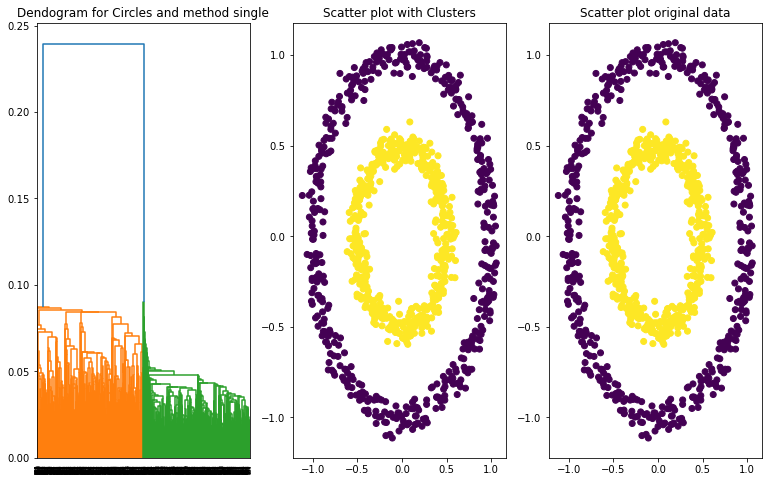

------


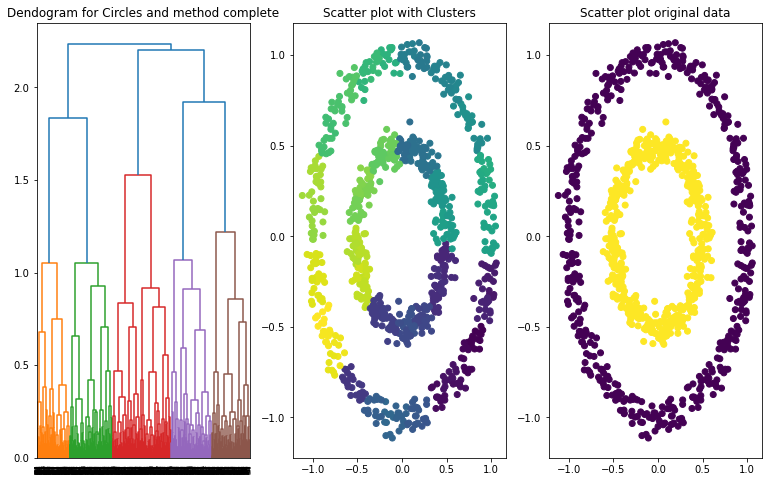

------


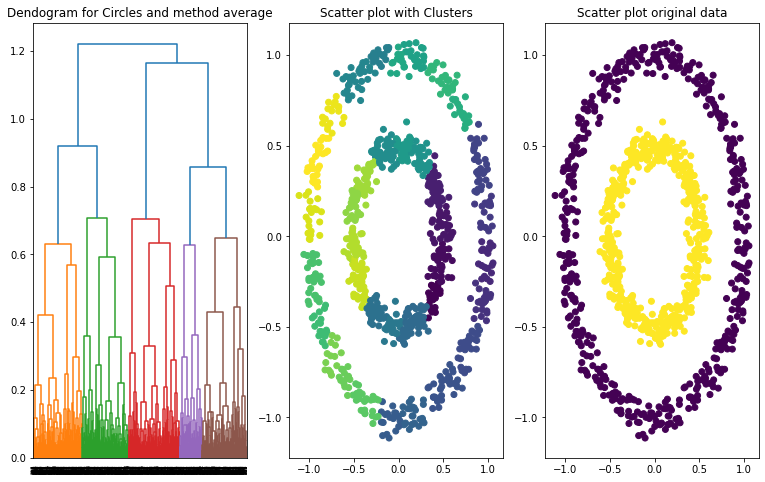

------


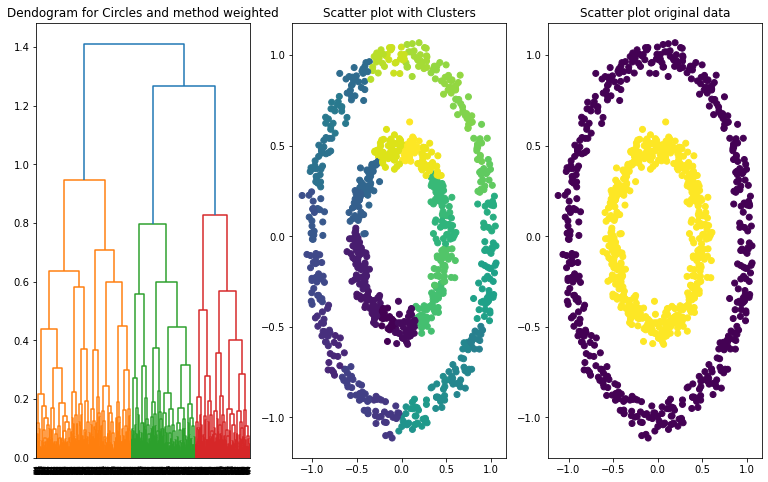

------


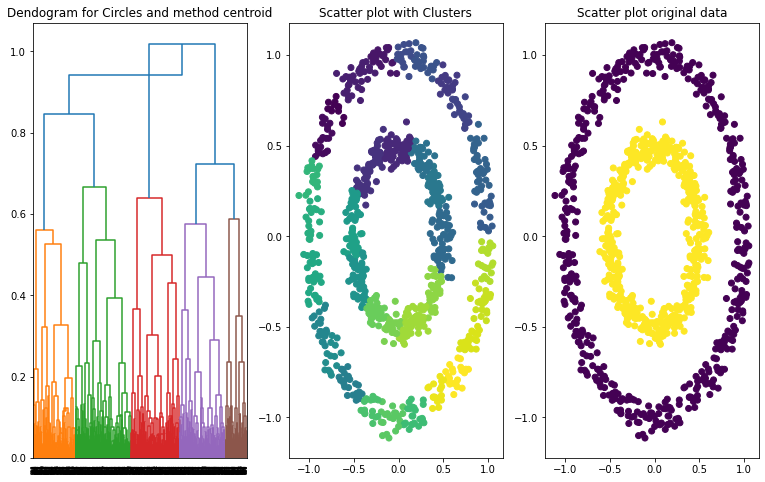

------


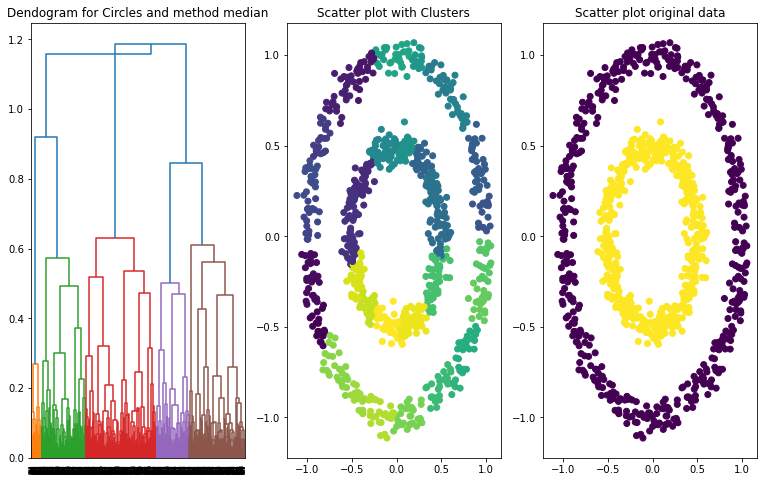

------


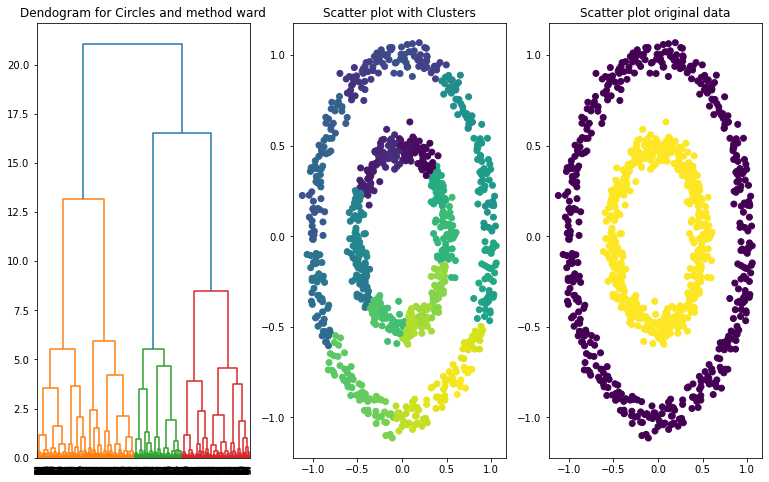

In [263]:
for i in methods:
    print('------')
    hCluster(i,X,y,'Circles')

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> Interpreta el dendrograma y comenta qué criterio de enlace se ha comportado mejor. ¿Por qué?
</div>

Tenemos un comportamiento similar al anterior. Con el data set de los circulos, un enlace simple, podemos distinguir mejor entre los dos anillos. La densidad es constante a lo largo de los circulos y además se aprecia distancia suficiente entre ellos para poder discriminar entre ambas agrupaciones. 

<a id="ej2"></a>

## 2. Ejemplo práctico con aperturas de ajedrez: reducción de dimensionalidad (6 puntos)

En ajedrez existen multitud de aperturas y variantes. Te permiten planificar como posicionarás tus piezas, lo cual puede otorgar una gran ventaja durante el desarrollo de la partida. Hay tantas aperturas distintas (cada una de ellas con sus variantes) que puede ser dificil situarte, como puede apreciarse en el siguiente video del Maestro FIDE [Luis Fernández](https://www.youtube.com/watch?v=soeEeadcOKw).

Como muchas aperturas se parecen a otras, porque tienen planes similares, una buena forma para ubicarse es saber cuales se parecen entre sí. Y esa es la idea de este análisis.

Partiremos de un [dataset de partidas de ajedrez](https://www.kaggle.com/datasets/datasnaek/chess) en la plataforma [lichess](https://lichess.org/), que consta de los siguientes campos (se resaltan los útiles para el análisis):

   - Game ID
   - Rated (T/F)
   - Start Time
   - End Time
   - **Number of Turns**
   - Game Status
   - Winner
   - Time Increment
   - White Player ID
   - White Player Rating
   - Black Player ID
   - Black Player Rating
   - **All Moves in Standard Chess Notation**
   - Opening Eco (código estandar de aperturas)
   - **Opening Name**
   - **Opening Ply** (número de movimientos de la apertura de la partida)

Se carga el dataset en un dataframe de pandas:

In [264]:
df = pd.read_csv('games.csv')
df.sample(3)

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply
12130,8nHOVQF6,True,1.498382e+12,1.498383e+12,95,resign,white,10+0,noobdude,1639,mistershy,1588,e4 e5 Nf3 Nf6 Bc4 Nxe4 d3 d5 dxe4 dxc4 Qxd8+ K...,C42,Russian Game: Urusov Gambit,5
15929,D5lb8oPZ,True,1.503483e+12,1.503484e+12,43,mate,white,15+0,sarthakmanna,1753,verya,1611,e4 g6 d4 Bg7 Bc4 e6 Nc3 Nc6 d5 exd5 exd5 Ne5 Q...,B06,Modern Defense: Bishop Attack,5
14851,eR1leKWj,False,1.504426e+12,1.504426e+12,51,mate,white,10+2,guruvachan,1196,mrunank,1609,e3 c5 d3 d5 Bd2 e5 Be2 Nc6 f3 Nf6 e4 d4 f4 Bd6...,A00,Van't Kruijs Opening,1


In [265]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20058 entries, 0 to 20057
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              20058 non-null  object 
 1   rated           20058 non-null  bool   
 2   created_at      20058 non-null  float64
 3   last_move_at    20058 non-null  float64
 4   turns           20058 non-null  int64  
 5   victory_status  20058 non-null  object 
 6   winner          20058 non-null  object 
 7   increment_code  20058 non-null  object 
 8   white_id        20058 non-null  object 
 9   white_rating    20058 non-null  int64  
 10  black_id        20058 non-null  object 
 11  black_rating    20058 non-null  int64  
 12  moves           20058 non-null  object 
 13  opening_eco     20058 non-null  object 
 14  opening_name    20058 non-null  object 
 15  opening_ply     20058 non-null  int64  
dtypes: bool(1), float64(2), int64(4), object(9)
memory usage: 2.3+ MB


In [266]:
df.shape

(20058, 16)

In [267]:
df.columns

Index(['id', 'rated', 'created_at', 'last_move_at', 'turns', 'victory_status',
       'winner', 'increment_code', 'white_id', 'white_rating', 'black_id',
       'black_rating', 'moves', 'opening_eco', 'opening_name', 'opening_ply'],
      dtype='object')

### 2 a. Preparación del dato

El primer paso al tratar con dato real es analizar el dato para comprender el dominio, y aplicar determinados filtrados en base a la lógica de tu tarea.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
filtra (quédate) las partidas que tienen aperturas de 4 o más movimientos (campo opening_ply).
</div>

In [268]:
print('Número de registros: {}'.format(df.shape[0]))
df = df[df["opening_ply"] >=4]

print('Número de registros luego del filtro: {}'.format(df.shape[0]))

Número de registros: 20058
Número de registros luego del filtro: 12536


In [269]:
df["opening_ply"].min()

4

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
filtra (quédate) las partidas que tienen al menos el doble de movimientos (campo "turns") que los de la apertura (campo opening_ply).
</div>

In [270]:
#Calculamos un ratio y filtramos a partir de este campo.

df['MoveRatio'] = df['turns'] / df['opening_ply']
df = df[df['MoveRatio']>=2] 

In [271]:
df.MoveRatio.min()

2.0

In [272]:
df.sample(1)

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply,MoveRatio
18428,bVnFoTHa,True,1.500765e+12,1.500765e+12,38,resign,white,180+0,olorinn,1268,sheik_yerbouti,1566,e4 e5 Bc4 Nf6 Nc3 h6 h3 d6 Nge2 Bd7 O-O Nc6 a3...,C26,Vienna Game: Stanley Variation,5,7.6


In [273]:
df = df.loc[:, df.columns != 'MoveRatio']

In [274]:
df.sample(1)

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply
302,vwQzM7Sg,True,1.503950e+12,1.503960e+12,43,resign,white,10+0,pepe100,1743,doom12384,1604,e4 e5 f4 exf4 Nf3 Nf6 Nc3 c6 Bc4 d5 e5 dxc4 ex...,C34,King's Gambit Accepted | Schallopp Defense,6


<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
si el nombre de la apertura (campo opening_name) contiene el caracter "|" ignora todo el texto que le sigue.
</div>

In [275]:
import re

In [276]:
#Reemplazamos en aquellos registros que cumplan la codición

df["opening_name_Clean"] = [re.sub(r'\|.*', '', i).strip() for i in df.opening_name]
df.head(1)

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply,opening_name_Clean
0,TZJHLljE,False,1.504210e+12,1.504210e+12,13,outoftime,white,15+2,bourgris,1500,a-00,1191,d4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5...,D10,Slav Defense: Exchange Variation,5,Slav Defense: Exchange Variation


<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
filtra (quédate) sólo las aperturas (por su nombre, campo opening_name) que hayan sido usadas en al menos 40 partidas. Para tener un mínimo de muestras de ese tipo, eliminando muchas aperturas apenas usadas.
</div>

In [277]:
# Agrupamos por apertura y contamos

Count_partidas = df[['opening_name_Clean', 'id']].groupby('opening_name_Clean').count().sort_values(by='id', ascending=False).reset_index()
Count_partidas.head()

,opening_name_Clean,id
0,Scotch Game,268
1,Scandinavian Defense: Mieses-Kotroc Variation,254
2,Italian Game: Two Knights Defense,236
3,Philidor Defense #3,195
4,Philidor Defense #2,193


Construímos una lista de las aperturas con 40 o más

In [278]:
#Filtramos

Count_partidas = Count_partidas[Count_partidas['id'] >= 40]
Count_partidas.head()

,opening_name_Clean,id
0,Scotch Game,268
1,Scandinavian Defense: Mieses-Kotroc Variation,254
2,Italian Game: Two Knights Defense,236
3,Philidor Defense #3,195
4,Philidor Defense #2,193


In [279]:
partidas = list(Count_partidas['opening_name_Clean'])
partidas[0:10]

['Scotch Game',
 'Scandinavian Defense: Mieses-Kotroc Variation',
 'Italian Game: Two Knights Defense',
 'Philidor Defense #3',
 'Philidor Defense #2',
 'Sicilian Defense',
 'Four Knights Game: Italian Variation',
 "Queen's Pawn Game: Chigorin Variation",
 'Italian Game: Anti-Fried Liver Defense',
 'French Defense: Advance Variation']

Filtramos con dicha lista

In [280]:
df = df[df['opening_name_Clean'].isin(partidas)]

In [281]:
df.shape

(7044, 17)

**AVISO: ¡no es necesario saber interpretar correctamente la notación algebraica para el desarrollo de la práctica!**

Los movimientos en ajedrez se pueden transcribir de distintas maneras, la más popular es la [notación algebraica](https://es.wikipedia.org/wiki/Notaci%C3%B3n_algebraica). En este caso, la notación algebraica empleada es la inglesa.

En concreto, el campo **moves** tiene los movimientos alternos tanto de las blancas como de las negras. Por tanto, la secuencia:

```e4 c5 Nf3 Qa5...```

Se interpretaría como:

 - Las blancas mueven el peón de rey a la casilla e4.
 - Las negras responden con el peón a c5.
 - Las blancas mueven el caballo (N) a la casilla f3.
 - Las negras mueven su dama a la casilla a5.
 
Y así alternan movimientos hasta el final de la partida (victoria, tablas, abandono o quedarse sin tiempo).

Es importante tener en cuenta que el campo **moves** es de tipo *string*, por lo que será necesario dividirlo por el separador (espacio) para tener cada movimiento por separado. Útil para los siguientes pasos.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
crea una columna llamada "white_moves" que contenga una lista con sólo los movimientos de la apertura del participante blanco (los impares del campo moves y tantos como indique opening_ply).
</div>

In [282]:
finals = []
for index,(e,i) in enumerate(zip(list(df["moves"]), list(df["opening_ply"]))):
    game = e.split(" ")
    whiteMove = []
    for o,u in enumerate(game):
        if o%2 == 0:
            whiteMove.append(u)
            #final.append(move)
            #print(move)
    final = whiteMove[:i]
    finals.append(final)

In [283]:
len(finals)==df.shape[0]

True

In [284]:
df["white_moves"] = finals
df.head(2)

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply,opening_name_Clean,white_moves
1,l1NXvwaE,True,1.504130e+12,1.504130e+12,16,resign,black,5+10,a-00,1322,skinnerua,1261,d4 Nc6 e4 e5 f4 f6 dxe5 fxe5 fxe5 Nxe5 Qd4 Nc6...,B00,Nimzowitsch Defense: Kennedy Variation,4,Nimzowitsch Defense: Kennedy Variation,"[d4, e4, f4, dxe5]"
4,9tXo1AUZ,True,1.504030e+12,1.504030e+12,95,mate,white,30+3,nik221107,1523,adivanov2009,1469,e4 e5 Nf3 d6 d4 Nc6 d5 Nb4 a3 Na6 Nc3 Be7 b4 N...,C41,Philidor Defense,5,Philidor Defense,"[e4, Nf3, d4, d5, a3]"


In [285]:
df.shape

(7044, 18)

Para comparar las aperturas entre sí usaremos los movimientos empleados en ella sólo por parte del jugador blanco (sólo hay nombre de la apertura del jugador blanco). Por simplicidad, podemos ignorar su orden, por lo que podemos usar la estrategia de [bag of words](https://es.wikipedia.org/wiki/Modelo_bolsa_de_palabras). Generando, a partir del campo **white_moves** un nuevo dataset con tantas dimensiones como posibles movimientos con un 1 si se ha realizado durante la apertura y un 0 si no se ha realizado.

Puedes crear nuevas columnas a partir de valores con el método [get_dummies()](https://pandas.pydata.org/docs/reference/api/pandas.get_dummies.html) de pandas.

Si el campo a partir del cual quieres generar las dimensiones es una lista de strings, [aquí](https://stackoverflow.com/questions/47786822/how-do-you-one-hot-encode-columns-with-a-list-of-strings-as-values) hay una pista.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
crea un nuevo dataframe usando el modelo bag of words a partir del campo white_moves. Puedes usar para ello el método get_dummies.
</div>

In [286]:
newDF = df['white_moves'].str.join('|').str.get_dummies()
newDF.sample(2)

,Ba2,Ba3,Ba4,Bb1,Bb2,Bb3,Bb5,Bb5+,Bb6,Bc1,...,gxf7+,gxh3,gxh5,h3,h4,h5,hxg3,hxg4,hxg5,hxg6
2122,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17979,0,0,1,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [287]:
newDF.shape

(7044, 379)

### 2 b. Reducción de dimensionalidad

En este punto tienes un dataset con tantas filas como partidas y tantas columnas como movimientos posibles efectuados en el conjunto de datos.

El problema es que ahora dispones de muchas dimensiones, por lo que para visualizar los datos y comprobar si hay algún tipo de estructura es necesario reducir su dimensionalidad. Obteniendo un *embedding* (representación compacta) de las aperturas.

La reducción de dimensionalidad puede llevarse a cabo con métodos como PCA. Pero este método tiene la limitación de que sólo realiza proyecciones lineales. Por lo que otros métodos como [t-SNE](https://www.youtube.com/watch?v=NEaUSP4YerM) o [UMAP](https://www.youtube.com/watch?v=jth4kEvJ3P8) pueden ofrecer mejores resultados.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
reduce la dimensionalidad de los datos mediante UMAP a dos dimensiones para poder visualizarlo posteriormente.
</div>

In [288]:
from umap import UMAP

In [289]:
UMAP_red = UMAP(n_components=2, random_state=42)

In [290]:
df[["Component_1","Component_2"]] = UMAP_red.fit_transform(newDF)

In [291]:
df[["opening_name_Clean","Component_1","Component_2"]].head(2)

,opening_name_Clean,Component_1,Component_2
1,Nimzowitsch Defense: Kennedy Variation,10.656115,-1.733218
4,Philidor Defense,10.338040,-3.279828


<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
visualiza la reducción de dimensionalidad mediante un scatter plot de la librería plotly donde cada punto es una muestra con coordenadas obtenidas tras la reducción de dimensionalidad. De tal manera que al situarnos encima de cada muestra con el ratón (hovertext) nos indique el nombre de la apertura usada, para poder explorar mejor los datos.
</div>

In [292]:
import plotly.express as px

fig = px.scatter(df[["opening_name_Clean","Component_1","Component_2"]], 
                                                                     x="Component_1", 
                                                                     y="Component_2",
                                                                     hover_name="opening_name_Clean")
fig.show()

In [293]:
fig = px.scatter(df[["opening_name_Clean","Component_1","Component_2"]], 
                                                                     x="Component_1", 
                                                                     y="Component_2",
                                                                     color = "opening_name_Clean",
                                                                     hover_name="opening_name_Clean")
fig.show()

### 2 c. Clustering

Tras observar la estructura de las muestras en baja dimensionalidad.

<div class="alert alert-block alert-info">
<strong>Análisis:</strong>
¿Qué método de clustering sería adecuado para detectar los distintos grupos? ¿Por qué?
</div>

Realizamos una prueba con Kmeas, 
a continuación gráficamos el codo

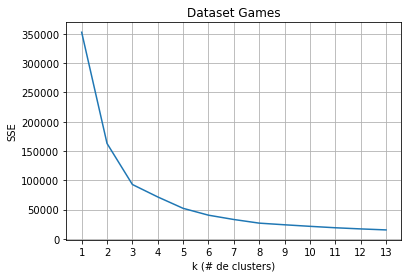

In [294]:
plot_Elbow_SSE(df[["Component_1","Component_2"]].values, 14, "Games")

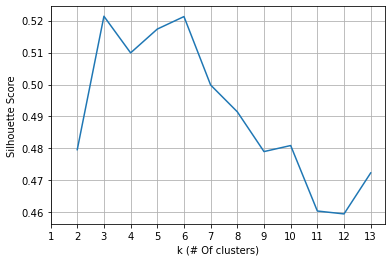

In [295]:
silhouetteGraph(14,df[["Component_1","Component_2"]].values)

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
realiza el clustering con la técnica elegida para que encuentre automáticamente los grupos.
</div>

Se realizó la implementación con Kmeans y DBSCAN

### KMeans

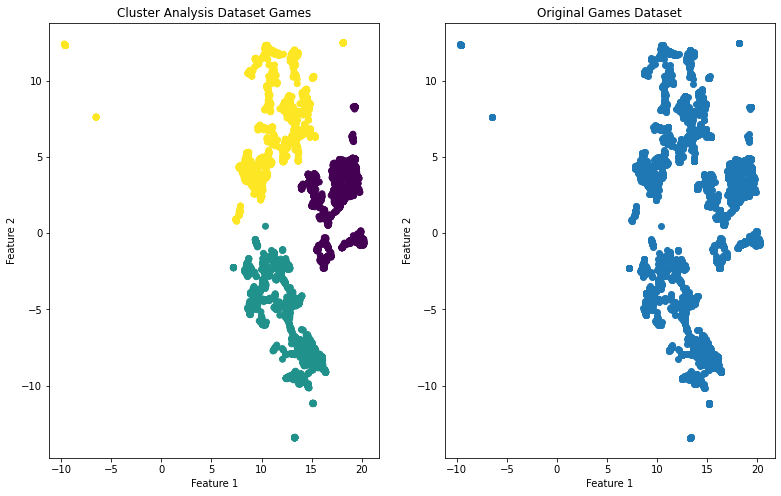

In [296]:
model = KMeans(n_clusters=3)
kmeansFinal_1 = model.fit_predict(df[["Component_1","Component_2"]].values)

fig,axes = plt.subplots(1, 2, figsize=(13, 8))
axes[0].scatter(df["Component_1"],df["Component_2"], c=kmeansFinal_1)
axes[1].scatter(df["Component_1"],df["Component_2"])
axes[0].set(xlabel="Feature 1", ylabel="Feature 2", title ="Cluster Analysis Dataset Games")
axes[1].set(xlabel="Feature 1", ylabel="Feature 2", title ="Original Games Dataset")

plt.show()

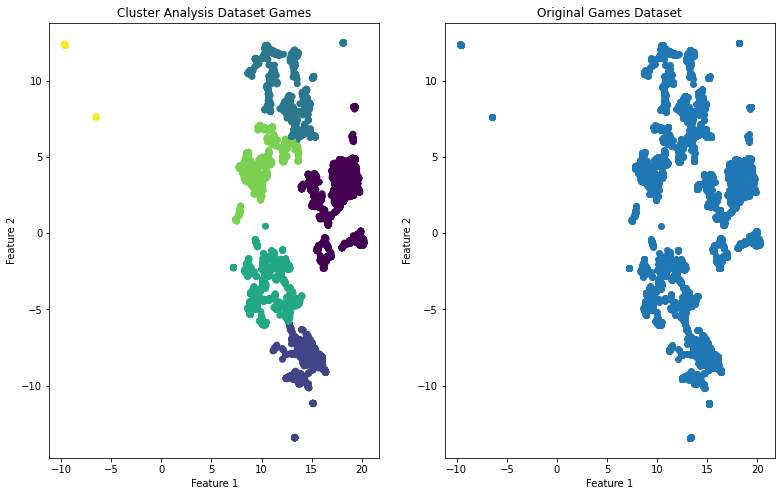

In [297]:
model = KMeans(n_clusters=6)
kmeansFinal_2 = model.fit_predict(df[["Component_1","Component_2"]].values)

fig,axes = plt.subplots(1, 2, figsize=(13, 8))
axes[0].scatter(df["Component_1"],df["Component_2"], c=kmeansFinal_2)
axes[1].scatter(df["Component_1"],df["Component_2"])
axes[0].set(xlabel="Feature 1", ylabel="Feature 2", title ="Cluster Analysis Dataset Games")
axes[1].set(xlabel="Feature 1", ylabel="Feature 2", title ="Original Games Dataset")

plt.show()

### DBSCAN

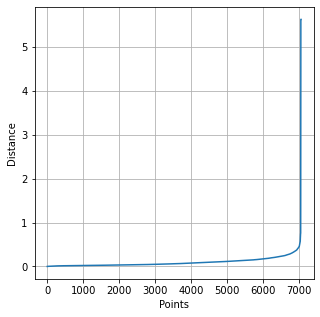

In [298]:
from sklearn.neighbors import NearestNeighbors

nearest_neighbors = NearestNeighbors(n_neighbors=11)
neighbors = nearest_neighbors.fit(df[["Component_1","Component_2"]])

distances, indices = neighbors.kneighbors(df[["Component_1","Component_2"]])
distances = np.sort(distances[:,10], axis=0)

fig = plt.figure(figsize=(5, 5))
plt.plot(distances)
plt.xlabel("Points")
plt.ylabel("Distance")
plt.grid()
plt.show()

In [299]:
def DBSCAN_grid_search(X,eps,min_samples,nameDataset):
    model = DBSCAN(eps=eps, min_samples=min_samples)
    model.fit(X)
    
    fig,axes = plt.subplots(1, 2, figsize=(13, 8))
    axes[0].scatter(X[:,0],X[:,1], c=model.labels_)
    axes[1].scatter(X[:,0],X[:,1])
    
    axes[0].set(xlabel="Feature 1", ylabel="Feature 2", title ="Clustering with DBSCAN, eps: {}, min_samples: {}".format(eps,min_samples))
    axes[1].set(xlabel="Feature 1", ylabel="Feature 2", title ="Original " + nameDataset)
    plt.show()

In [300]:
epsilon_values = [round(i,3) for i in np.arange(0.10, 1.25, 0.15)]
epsilon_values

[0.1, 0.25, 0.4, 0.55, 0.7, 0.85, 1.0, 1.15]

------


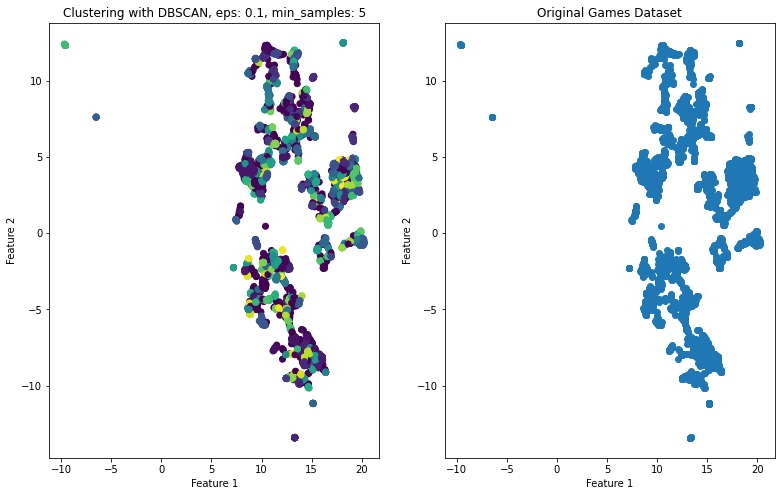

------


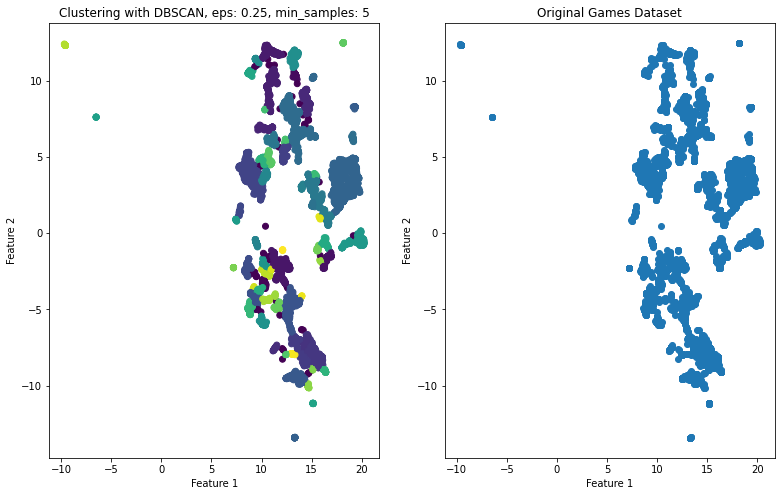

------


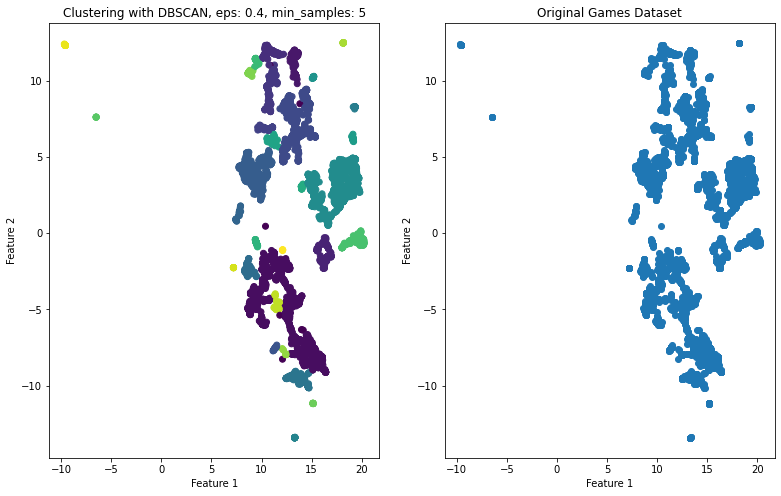

------


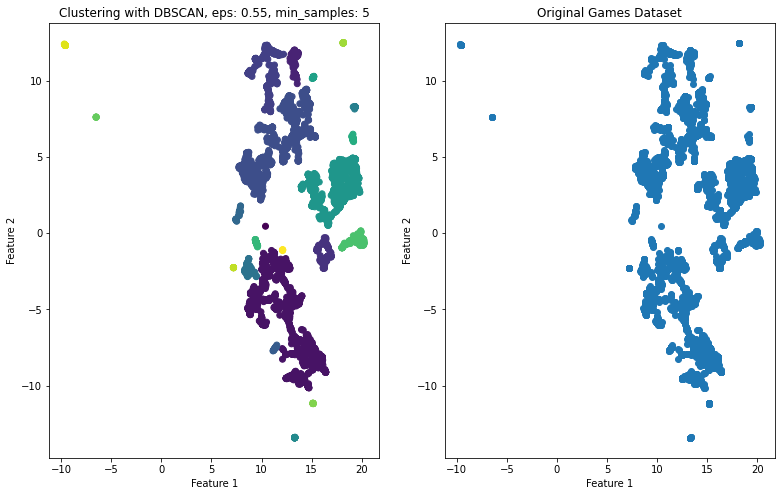

------


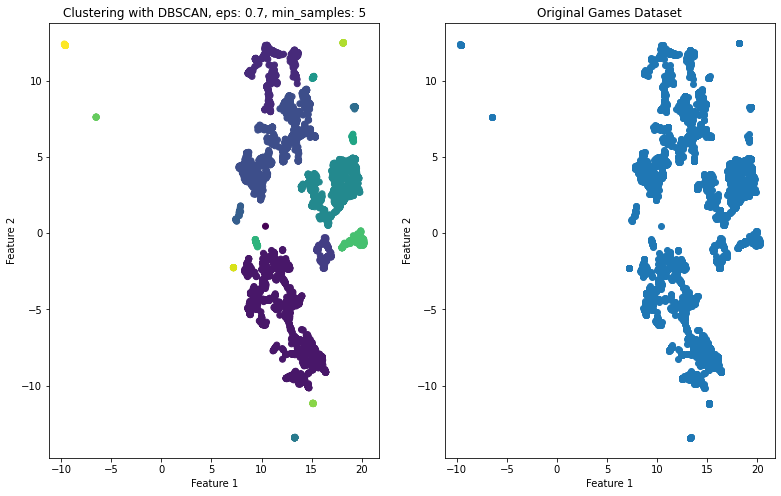

------


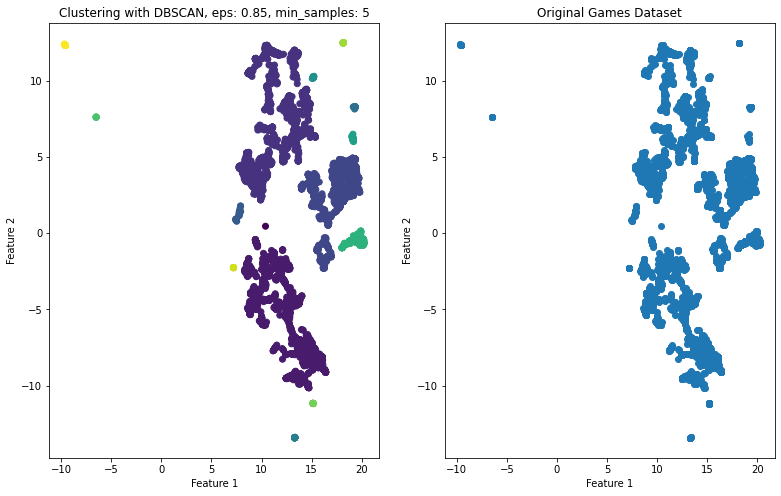

------


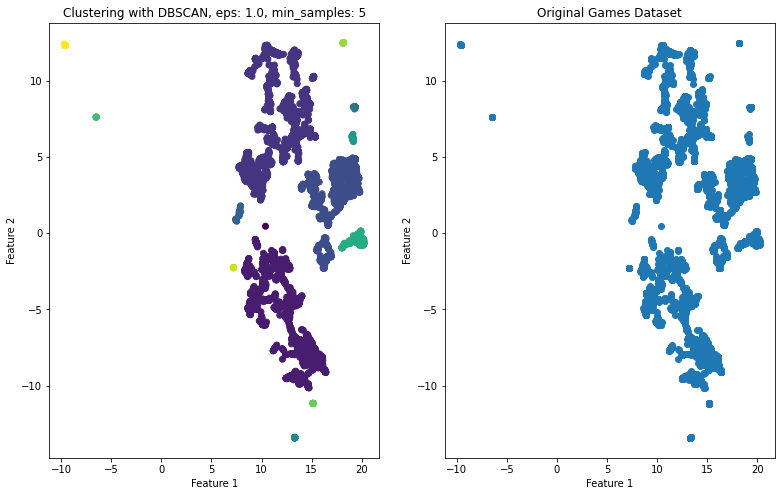

------


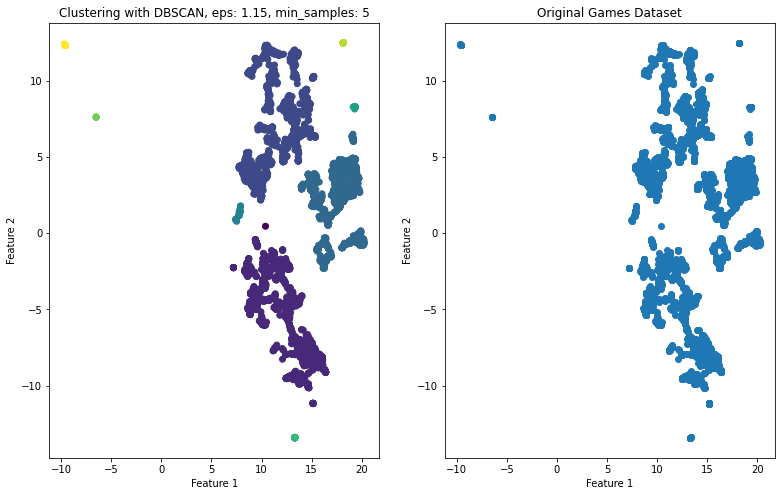

In [301]:
for i in epsilon_values:
    print("------")
    DBSCAN_grid_search(df[["Component_1","Component_2"]].values,i,5, "Games Dataset")

Decidimos quedarnos con KMeans debido a que nos da agrupaciones claramente definidas

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
visualiza el anterior scatter plot con la novedad de que el color de cada muestra se corresponda con el cluster asociado para poder observar el efecto del clustering. Utiliza una paleta de colores cualitativa (discreta) para facilitar su interpretación.
</div>

Quedó implementado en las celdas anteriores

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
para cada cluster, visualiza un gráfico de barras donde cada barra sea una de las aperturas que aparecen en el cluster y su tamaño se corresponda con el número de muestras dentro de ese grupo que han realizado esa apertura. Como consejo, puedes usar matplotlib o incluso pandas. También puede ser útil graficar con barras horizontales en lugar de verticales para facilitar su lectura.
</div>

In [302]:
df["Clusters_KMeansFinal_1"] = kmeansFinal_1
df["Clusters_KMeansFinal_2"] = kmeansFinal_2

df.sample(2)

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,...,moves,opening_eco,opening_name,opening_ply,opening_name_Clean,white_moves,Component_1,Component_2,Clusters_KMeansFinal_1,Clusters_KMeansFinal_2
13322,6IFsdQvO,True,1.492281e+12,1.492281e+12,66,resign,black,15+1,tharmarajah,1349,...,e4 e5 Nf3 Nc6 a3 Bc5 d3 Nf6 Be3 Bxe3 fxe3 d5 B...,C44,King's Knight Opening: Normal Variation,4,King's Knight Opening: Normal Variation,"[e4, Nf3, a3, d3]",14.576429,7.947670,2,2
19345,ZEroJxFf,True,1.501794e+12,1.501796e+12,46,resign,black,30+30,dumbluck,2022,...,e4 e6 d4 d5 exd5 exd5 c4 Nf6 Nf3 Bg4 h3 Bh5 g4...,C01,French Defense: Exchange Variation | Monte Ca...,7,French Defense: Exchange Variation,"[e4, d4, exd5, c4, Nf3, h3, g4]",10.115669,-4.324886,1,3


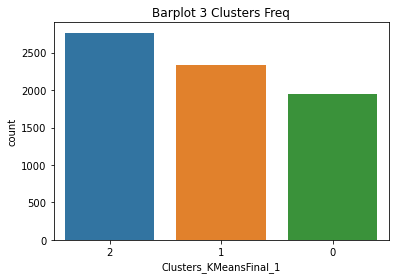

In [303]:
sns.countplot(x="Clusters_KMeansFinal_1", 
              data=df,
              order = df['Clusters_KMeansFinal_1'].value_counts().index).set(title='Barplot 3 Clusters Freq')
plt.show()

Con el modelo de 3 clusters, el de mayor número de observaciones es el 2.

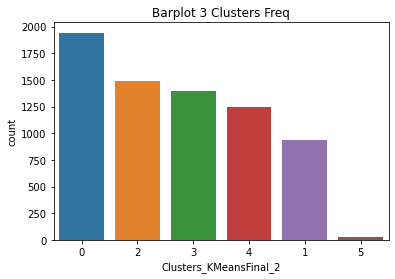

In [304]:
sns.countplot(x="Clusters_KMeansFinal_2", 
              data=df,
              order = df['Clusters_KMeansFinal_2'].value_counts().index).set(title='Barplot 3 Clusters Freq')
plt.show()

En el caso del modelo de 6 clusters el 4 y 5 tienen el mayor número de frecuencias.

In [305]:
c1 = df[df["Clusters_KMeansFinal_1"] == 0].groupby("opening_name_Clean").count().reset_index().iloc[:,0:2].sort_values("id", ascending=False)
c1.head()

,opening_name_Clean,id
40,Scandinavian Defense: Mieses-Kotroc Variation,202
37,Ruy Lopez: Morphy Defense,147
36,Ruy Lopez: Exchange Variation,115
25,Philidor Defense #2,114
38,Ruy Lopez: Steinitz Defense,109


In [306]:
c2 = df[df["Clusters_KMeansFinal_1"] == 1].groupby("opening_name_Clean").count().reset_index().iloc[:,0:2].sort_values("id", ascending=False)
c3 = df[df["Clusters_KMeansFinal_1"] == 2].groupby("opening_name_Clean").count().reset_index().iloc[:,0:2].sort_values("id", ascending=False)

### Modelo con 3 Clusters

Se realizan las visualizaciones con el top 25 de juegos para tener gráficos interpretables

En este modelo el cluster 1 se encuentra conformado por variaciones del juego italiano, aperturas del rey y variaciones del juego Ruso

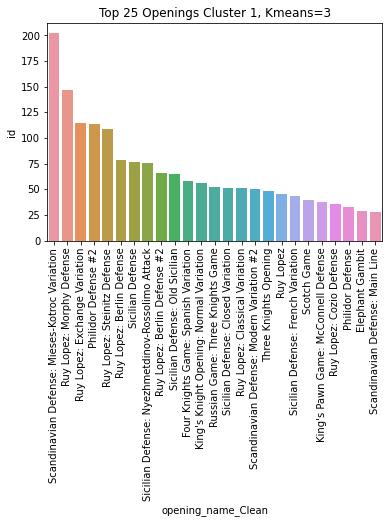

In [307]:
sns.barplot(x="opening_name_Clean",
            y = "id",
            data= c1.head(25)
              #order = df['opening_name_Clean'].value_counts().index).set(title='Barplot Cluster 1')
             ).set(title='Top 25 Openings Cluster 1, Kmeans=3')
plt.xticks(rotation=90)
plt.show()

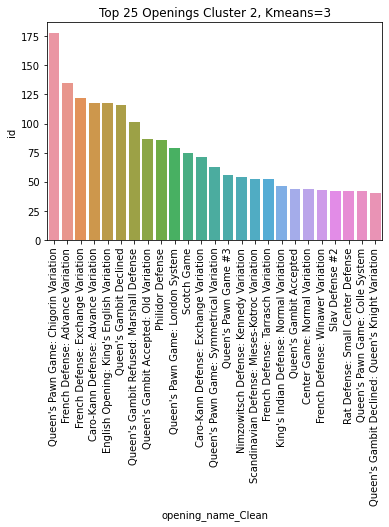

In [308]:
sns.barplot(x="opening_name_Clean",
            y = "id",
            data= c2.head(25)
              #order = df['opening_name_Clean'].value_counts().index).set(title='Barplot Cluster 1')
             ).set(title='Top 25 Openings Cluster 2, Kmeans=3')
plt.xticks(rotation=90)
plt.show()

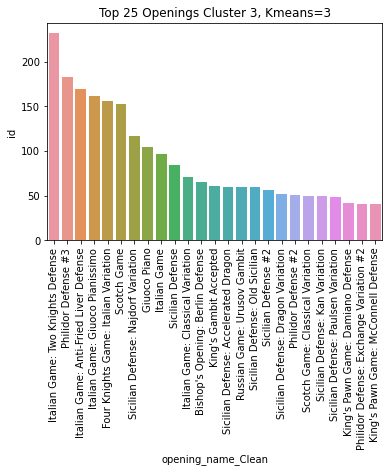

In [309]:
sns.barplot(x="opening_name_Clean",
            y = "id",
            data = c3.head(25)
              #order = df['opening_name_Clean'].value_counts().index).set(title='Barplot Cluster 1')
             ).set(title='Top 25 Openings Cluster 3, Kmeans=3')
plt.xticks(rotation=90)
plt.show()

### Modelo con 6 Clusters

In [310]:
c1 = df[df["Clusters_KMeansFinal_2"] == 0].groupby("opening_name_Clean").count().reset_index().iloc[:,0:2].sort_values("id", ascending=False)
c2 = df[df["Clusters_KMeansFinal_2"] == 1].groupby("opening_name_Clean").count().reset_index().iloc[:,0:2].sort_values("id", ascending=False)
c3 = df[df["Clusters_KMeansFinal_2"] == 2].groupby("opening_name_Clean").count().reset_index().iloc[:,0:2].sort_values("id", ascending=False)
c4 = df[df["Clusters_KMeansFinal_2"] == 3].groupby("opening_name_Clean").count().reset_index().iloc[:,0:2].sort_values("id", ascending=False)
c5 = df[df["Clusters_KMeansFinal_2"] == 4].groupby("opening_name_Clean").count().reset_index().iloc[:,0:2].sort_values("id", ascending=False)
c6 = df[df["Clusters_KMeansFinal_2"] == 5].groupby("opening_name_Clean").count().reset_index().iloc[:,0:2].sort_values("id", ascending=False)


c6.sample(2)

,opening_name_Clean,id
2,Queen's Gambit Accepted,1
1,Italian Game: Giuoco Pianissimo,2


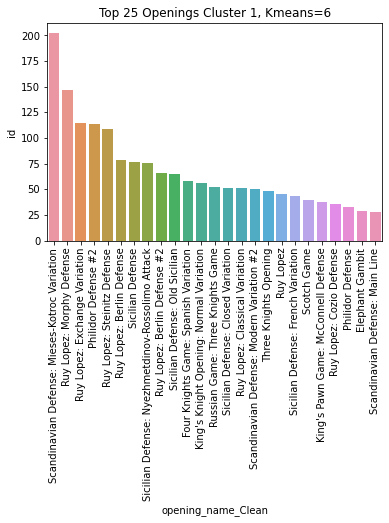

In [311]:
sns.barplot(x="opening_name_Clean",
            y = "id",
            data = c1.head(25)
              #order = df['opening_name_Clean'].value_counts().index).set(title='Barplot Cluster 1')
             ).set(title='Top 25 Openings Cluster 1, Kmeans=6')
plt.xticks(rotation=90)
plt.show()

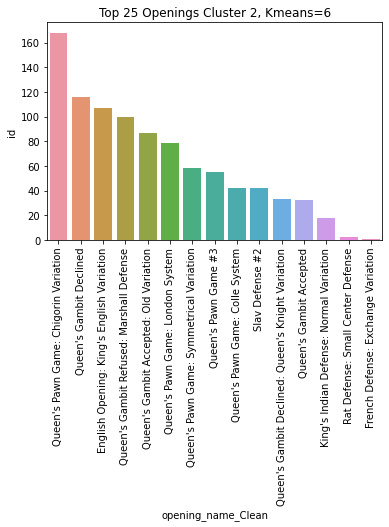

In [312]:
sns.barplot(x="opening_name_Clean",
            y = "id",
            data = c2.head(25)
              #order = df['opening_name_Clean'].value_counts().index).set(title='Barplot Cluster 1')
             ).set(title='Top 25 Openings Cluster 2, Kmeans=6')
plt.xticks(rotation=90)
plt.show()

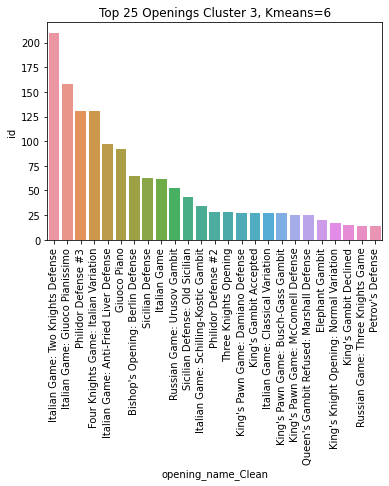

In [313]:
sns.barplot(x="opening_name_Clean",
            y = "id",
            data = c3.head(25)
              #order = df['opening_name_Clean'].value_counts().index).set(title='Barplot Cluster 1')
             ).set(title='Top 25 Openings Cluster 3, Kmeans=6')
plt.xticks(rotation=90)
plt.show()

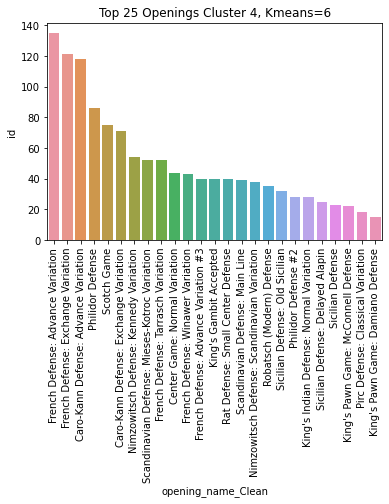

In [314]:
sns.barplot(x="opening_name_Clean",
            y = "id",
            data = c4.head(25)
              #order = df['opening_name_Clean'].value_counts().index).set(title='Barplot Cluster 1')
             ).set(title='Top 25 Openings Cluster 4, Kmeans=6')
plt.xticks(rotation=90)
plt.show()

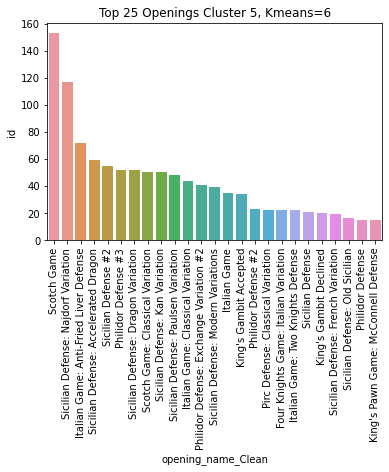

In [315]:
sns.barplot(x="opening_name_Clean",
            y = "id",
            data = c5.head(25)
              #order = df['opening_name_Clean'].value_counts().index).set(title='Barplot Cluster 1')
             ).set(title='Top 25 Openings Cluster 5, Kmeans=6')
plt.xticks(rotation=90)
plt.show()

Jugadas estulo Ruy Lopez predominan en este Cluster

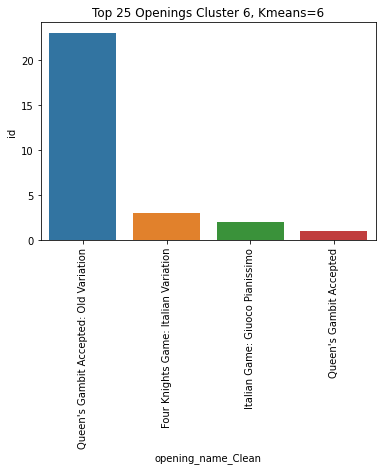

In [316]:
sns.barplot(x="opening_name_Clean",
            y = "id",
            data = c6.head(25)
              #order = df['opening_name_Clean'].value_counts().index).set(title='Barplot Cluster 1')
             ).set(title='Top 25 Openings Cluster 6, Kmeans=6')
plt.xticks(rotation=90)
plt.show()

La defensa escandinava es la de mayor frecuencia dentro del cluster

### 2 d. Análisis

Una manera habitual de comparar variables (en este caso aperturas) es emplear una matriz de distancias. Donde podemos representar cuál es la distancia mínima, media o máxima entre dos aperturas.

Dado que cada apertura tiene distintas muestras (al menos 40). Si usamos el mínimo y tuviésemos 5 muestras de la apertura A y 3 de la B. La distancia entre las aperturas A y B sería la mínima de las 15 distancias posibles que hay entre las 5 muestras de A y las 3 de B.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
calcula y visualiza la distancia (euclídea en este caso) entre todas las aperturas mediante una matriz de distancias usando plotly o seaborn (mediante un heatmap). El proceso de cálculo puede llevar mucho tiempo. Se recomienda calcular la distancia entre las muestras en baja dimensionalidad usando la librería numpy empleando la normal tras la resta de las muestras. Si aún así se dilata en el tiempo puedes probar a realizar sampling aleatorio del dataset para reducir el número de muestras. Peinsa que la matriz de distancia tiene bastantes simetrías que pueden ser aprovechadas para ahorrar cálculos. Puedes utilizar tqdm para visualizar y estimar la duración del proceso de cálculo.
</div>

Utilizamos la función de scipy para armar la matriz de distancias. Tomando como ejemplo el artículo del por tal de programación Geek for Geeks

https://www.geeksforgeeks.org/scipy-spatial-distance-matrix/#:~:text=A%20distance%20matrix%20contains%20the,(%201%2DD%20array).


In [317]:
import numpy as np
from scipy.spatial import distance_matrix
 
dist_mat = distance_matrix(np.array(df[["Component_1","Component_2"]][:7044]), 
                           np.array(df[["Component_1","Component_2"]][:7044]), p=2)
 
dataDistances = pd.DataFrame(dist_mat,
                             columns = df[["opening_name_Clean"]].values, 
                             index = df[["opening_name_Clean"]].values)

In [318]:
dataDistances

,"(Nimzowitsch Defense: Kennedy Variation,)","(Philidor Defense,)","(Italian Game: Schilling-Kostic Gambit,)","(Scandinavian Defense: Mieses-Kotroc Variation,)","(French Defense: Advance Variation,)","(Four Knights Game: Italian Variation,)","(Italian Game: Two Knights Defense,)","(Four Knights Game: Italian Variation,)","(Four Knights Game: Italian Variation,)","(Philidor Defense #3,)",...,"(Italian Game: Classical Variation,)","(Italian Game: Classical Variation,)","(Italian Game: Two Knights Defense,)","(Sicilian Defense: Najdorf Variation,)","(Sicilian Defense: Najdorf Variation,)","(Sicilian Defense,)","(English Opening: King's English Variation,)","(English Opening: King's English Variation,)","(French Defense: Advance Variation #3,)","(French Defense: Exchange Variation,)"
"(Nimzowitsch Defense: Kennedy Variation,)",0.000000,1.578978,12.305590,5.578063,1.737313,13.702293,10.763975,14.023510,8.637681,11.027720,...,5.502008,7.835916,13.869697,6.266626,5.706305,6.856983,5.817846,5.949392,1.032352,4.213359
"(Philidor Defense,)",1.578978,0.000000,13.884323,5.968139,2.392995,15.260674,12.319596,15.571082,10.174708,12.582861,...,7.047805,9.388576,15.413726,7.693936,7.057049,8.435593,4.718537,4.823628,1.974350,2.641877
"(Italian Game: Schilling-Kostic Gambit,)",12.305590,13.884323,0.000000,12.818826,12.327650,2.825565,2.796535,3.462848,4.598377,2.328123,...,7.109869,4.958434,3.509955,7.498461,8.401915,5.448819,17.124034,17.292468,12.222023,16.504540
"(Scandinavian Defense: Mieses-Kotroc Variation,)",5.578063,5.968139,12.818826,0.000000,3.847874,15.082225,12.464883,15.582414,10.902154,10.785442,...,8.284894,10.000961,15.497107,9.809584,9.699378,8.220914,5.403546,5.567477,4.545777,7.114696
"(French Defense: Advance Variation,)",1.737313,2.392995,12.327650,3.847874,0.000000,14.036204,11.148621,14.421902,9.161889,10.773759,...,6.080214,8.293851,14.288655,7.199643,6.806670,6.966555,4.948831,5.106075,0.710316,4.496176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"(Sicilian Defense,)",6.856983,8.435593,5.448819,8.220914,6.966555,7.099849,4.296049,7.525159,2.761107,4.401770,...,2.076037,1.910436,7.410817,3.402866,4.078597,0.000000,11.863683,12.027572,6.802529,11.057015
"(English Opening: King's English Variation,)",5.817846,4.718537,17.124034,5.403546,4.948831,18.957392,16.087156,19.356776,14.110020,15.389045,...,11.015315,13.242581,19.227296,12.021160,11.513569,11.863683,0.000000,0.172646,5.309654,3.423980
"(English Opening: King's English Variation,)",5.949392,4.823628,17.292468,5.567477,5.106075,19.120137,16.247672,19.517966,14.265949,15.560321,...,11.168096,13.399868,19.387894,12.163291,11.649216,12.027572,0.172646,0.000000,5.457392,3.438466
"(French Defense: Advance Variation #3,)",1.032352,1.974350,12.222023,4.545777,0.710316,13.809375,10.895336,14.170428,8.847913,10.777828,...,5.726683,8.001248,14.028915,6.726165,6.273694,6.802529,5.309654,5.457392,0.000000,4.365067


Tomamos una muestra para realizar el heatmap

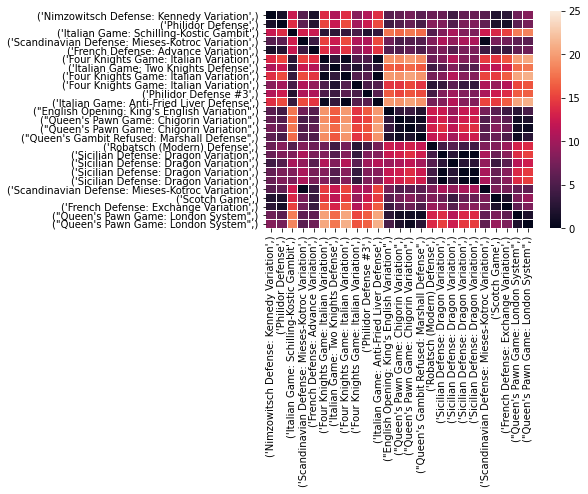

In [319]:
import seaborn as sns

ax = sns.heatmap(dataDistances.iloc[0:25, 0:25],
                 yticklabels=True,
                 xticklabels=True,
                 linewidths=.005,
                 vmin=0, 
                 vmax=25,
                 cbar=True)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong>
Argumenta las conclusiones obtenidas tras interpretar las visualizaciones de los puntos anteriores: estructura de las muestras en baja dimensionalidad, clustering, gráficos de la dominancia de las aperturas contenidas en cada cluster y la matriz de distancias.
</div>

In [320]:
Cs = [c1,c2,c3,c4,c5,c6]

for e,i in enumerate(Cs):
    print("--------")
    print("Cluster Number {} Top Games".format(e))
    #print("Cluster Number {}".format(i))
    print(i.head(10))

--------
Cluster Number 0 Top Games
                                  opening_name_Clean   id
40     Scandinavian Defense: Mieses-Kotroc Variation  202
37                         Ruy Lopez: Morphy Defense  147
36                     Ruy Lopez: Exchange Variation  115
25                               Philidor Defense #2  114
38                       Ruy Lopez: Steinitz Defense  109
32                         Ruy Lopez: Berlin Defense   79
44                                  Sicilian Defense   77
49  Sicilian Defense: Nyezhmetdinov-Rossolimo Attack   76
33                      Ruy Lopez: Berlin Defense #2   66
50                    Sicilian Defense: Old Sicilian   65
--------
Cluster Number 1 Top Games
                           opening_name_Clean   id
9       Queen's Pawn Game: Chigorin Variation  168
5                     Queen's Gambit Declined  116
0   English Opening: King's English Variation  107
7    Queen's Gambit Refused: Marshall Defense  100
4      Queen's Gambit Accepted: Old

### Conclusiones

Analizamos los resultados del KMeans con 6 Clusters:

- El cluster 1 se encuentra conformado por aperturas de la reina
- El cluster 2 por Juegos Italianos, Sicilianos, Rusos y aperturas del Rey. 
- El cluster 3 es similar al cluster 2 en su conformación.
- El cluster 4 es similar al cluster 2 y 3 en su conformación. 
- El cluster 5 tiene juegos de Ruy Lopez en su mayoría
- El cluster 6 se encuentra compuesto por defensas Escandinavas, Francesas y Caro-Kann.


Representamos solamente un pedazo de la matriz para poder interpretarla. El gráfico real sería una matriz de 7000 * 7000
En el gráfico aquellos cuadrados en negro signifcan menor distancia y mayor similitud entre aperturas. 

Todas las aperturas de la reina son cercanas a los juego italianos Anti Fried e Inglés con apertura del rey.

### 2 e. OPCIONAL

Para comprender mejor lo analizado, puedes visualizar las aperturas de las muestras mediante la librería **chess** que facilita mucho la tarea.

Para ello selecciona una muestra (más fácil) o un tipo de apertura, y de la columna *moves* selecciona 2 * *opening_ply* movimientos de la apertura (el x2 es para coger los de las blancas y las negras). Una vez que ya los tengas puedes crear un tablero con la librería chess:

```board = chess.Board()```

Tras ello, simplemente itera por esos primeros y pásaselos al tablero mediante el método ```push_san``` con:

```board.push_san('d4')```

hasta agotar los movimientos **SOLO de la apertura** de blancas y negras en el mismo orden en el que ya aparecen en el campo *moves*.

In [ ]:
!pip install chess